In [63]:
import matplotlib
matplotlib.use('Agg')
%matplotlib inline
import matplotlib.pyplot as plt
import itertools

import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torch.autograd import Variable
import torch

import numpy as np
import random
import copy
import time
from sklearn.model_selection import train_test_split

import os
#os.environ["CUDA_VISIBLE_DEVICES"] = "0,1,2,3"

from PIL import Image, ImageOps
import cv2

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Read data

In [86]:
base_path = "C:/Users/user/OneDrive - 성균관대학교/Desktop/HealthPort/segmentation"

pixel_size = 256

    
with open(f"{base_path}/orig_{pixel_size}.npy", 'rb') as f:
    orig_images = np.load(f)
    
with open(f"{base_path}/mask_{pixel_size}.npy", 'rb') as f:
    mask_images = np.load(f)    

# Create train-test split

In [22]:
x_train, x_test, y_train, y_test = train_test_split(orig_images, mask_images, test_size=0.2, random_state=42)


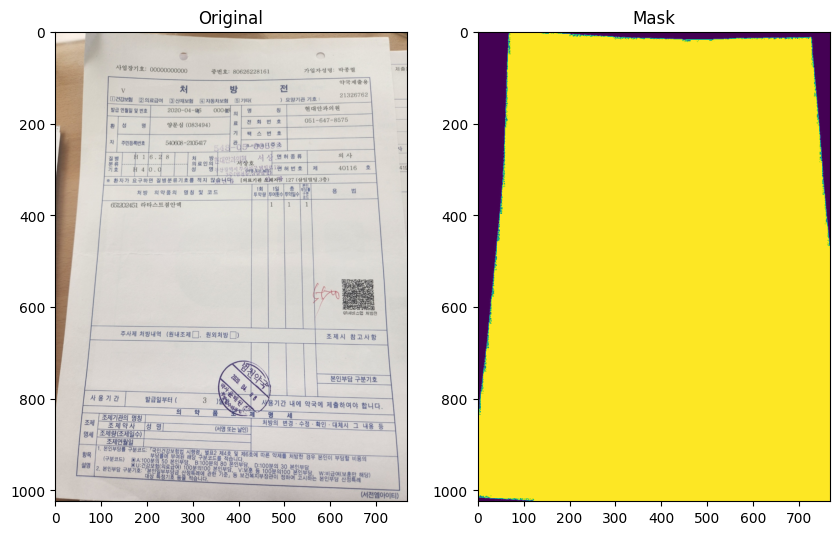

In [26]:
f, axarr = plt.subplots(1,2, figsize=(10,7))

i = -3

cur_orig = x_train[i]
cur_mask = y_train[i]

axarr[0].imshow(cur_orig)
axarr[0].title.set_text('Original')

axarr[1].imshow(cur_mask)
axarr[1].title.set_text('Mask')


# Create dataloader

In [27]:
from torch.utils.data import Dataset, DataLoader
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import random
from PIL import Image
import torchvision.transforms.functional as TF

norm_mean = [ 0.485, 0.456, 0.406 ]
norm_std  = [ 0.229, 0.224, 0.225 ]

class CustomDataset(Dataset):
    def __init__(self, x_data, y_data, test=False):


        self.data = np.transpose(x_data, (0, 3, 1, 2))
        self.targets = np.transpose(y_data, (0, 1, 2))
        
        self.test = test

    def __len__(self):
        return self.targets.shape[0]
    
    
    
    def transform(self, image, mask):
        # Resize
        if not self.test:
            p = 0.4
            p_shift = 0.1

            # Random horizontal flipping
            if random.random() < p_shift:
                image = TF.hflip(image)
                mask = TF.hflip(mask)

            # Random vertical flipping
            if random.random() < p_shift:
                image = TF.vflip(image)
                mask = TF.vflip(mask)

            if random.random() < p:

                image = TF.adjust_brightness(image, random.uniform(0.6, 1.4))
                image = TF.adjust_contrast(image, random.uniform(0.8, 1.2))
                image = TF.adjust_gamma(image, random.uniform(0.8, 1.2))
                image = TF.adjust_hue(image, random.uniform(-0.2, 0.2))
                image = TF.adjust_saturation(image, random.uniform(0.8, 1.2))


            if random.random() < p_shift:
                angle_factor = random.randint(-30, 30)
                translate_factor = random.uniform(0.0, 0.3)
                scale_factor = random.uniform(0.5, 1.5)
                shear_factor = random.randint(-30, 30)

                image = TF.affine(image, angle=angle_factor, translate=(0,0), scale=scale_factor, shear=shear_factor)
                mask = TF.affine(mask, angle=angle_factor, translate=(0,0), scale=scale_factor, shear=shear_factor)


        # Transform to tensor
        image = TF.to_tensor(image)
        image = TF.normalize(image, mean=norm_mean, std=norm_std)
        mask = TF.to_tensor(mask)
        return image, mask
    
    

    def __getitem__(self, index):

        
        image = Image.fromarray(self.data[index].astype(np.uint8).transpose(1, 2, 0))
        mask = Image.fromarray(self.targets[index].astype(np.uint8))      
        
        x, y = self.transform(image, mask)

        return x, y


In [28]:
train_set = CustomDataset(x_train, y_train, test=False)
trainloader = torch.utils.data.DataLoader(train_set, batch_size=24, shuffle=True, num_workers=16, 
                                         persistent_workers=True)

test_set = CustomDataset(x_test, y_test, test=True)
testloader = torch.utils.data.DataLoader(test_set, batch_size=24, shuffle=True, num_workers=16,
                                        persistent_workers=True)

# Create model

In [29]:
from models.u2net import RSU7, RSU6, RSU5, RSU4, RSU4F, _upsample_like

class U2NETP(nn.Module):

    def __init__(self,in_ch=3,out_ch=3):
        super(U2NETP,self).__init__()

        self.stage1 = RSU7(in_ch,16,64)
        self.pool12 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

        self.stage2 = RSU6(64,16,64)
        self.pool23 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

        self.stage3 = RSU5(64,16,64)
        self.pool34 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

        self.stage4 = RSU4(64,16,64)
        self.pool45 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

        self.stage5 = RSU4F(64,16,64)
        self.pool56 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

        self.stage6 = RSU4F(64,16,64)

        # decoder
        self.stage5d = RSU4F(128,16,64)
        self.stage4d = RSU4(128,16,64)
        self.stage3d = RSU5(128,16,64)
        self.stage2d = RSU6(128,16,64)
        self.stage1d = RSU7(128,16,64)

        self.side1 = nn.Conv2d(64,out_ch,3,padding=1)
        self.side2 = nn.Conv2d(64,out_ch,3,padding=1)
        self.side3 = nn.Conv2d(64,out_ch,3,padding=1)
        self.side4 = nn.Conv2d(64,out_ch,3,padding=1)
        self.side5 = nn.Conv2d(64,out_ch,3,padding=1)
        self.side6 = nn.Conv2d(64,out_ch,3,padding=1)

        self.outconv = nn.Conv2d(6*out_ch,out_ch,1)

    def forward(self,x):

        hx = x

        #stage 1
        hx1 = self.stage1(hx)
        hx = self.pool12(hx1)

        #stage 2
        hx2 = self.stage2(hx)
        hx = self.pool23(hx2)

        #stage 3
        hx3 = self.stage3(hx)
        hx = self.pool34(hx3)

        #stage 4
        hx4 = self.stage4(hx)
        hx = self.pool45(hx4)

        #stage 5
        hx5 = self.stage5(hx)
        hx = self.pool56(hx5)

        #stage 6
        hx6 = self.stage6(hx)
        hx6up = _upsample_like(hx6,hx5)

        #decoder
        hx5d = self.stage5d(torch.cat((hx6up,hx5),1))
        hx5dup = _upsample_like(hx5d,hx4)

        hx4d = self.stage4d(torch.cat((hx5dup,hx4),1))
        hx4dup = _upsample_like(hx4d,hx3)

        hx3d = self.stage3d(torch.cat((hx4dup,hx3),1))
        hx3dup = _upsample_like(hx3d,hx2)

        hx2d = self.stage2d(torch.cat((hx3dup,hx2),1))
        hx2dup = _upsample_like(hx2d,hx1)

        hx1d = self.stage1d(torch.cat((hx2dup,hx1),1))


        #side output
        d1 = self.side1(hx1d)

        d2 = self.side2(hx2d)
        d2 = _upsample_like(d2,d1)

        d3 = self.side3(hx3d)
        d3 = _upsample_like(d3,d1)

        d4 = self.side4(hx4d)
        d4 = _upsample_like(d4,d1)

        d5 = self.side5(hx5d)
        d5 = _upsample_like(d5,d1)

        d6 = self.side6(hx6)
        d6 = _upsample_like(d6,d1)

        d0 = self.outconv(torch.cat((d1,d2,d3,d4,d5,d6),1))

        return d0

In [30]:
generator = U2NETP(out_ch=1)

generator = nn.DataParallel(generator)
generator.to(device)

DataParallel(
  (module): U2NETP(
    (stage1): RSU7(
      (rebnconvin): REBNCONV(
        (conv_s1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (bn_s1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu_s1): ReLU(inplace=True)
      )
      (rebnconv1): REBNCONV(
        (conv_s1): Conv2d(64, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (bn_s1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu_s1): ReLU(inplace=True)
      )
      (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
      (rebnconv2): REBNCONV(
        (conv_s1): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (bn_s1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu_s1): ReLU(inplace=True)
      )
      (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=Tru

In [31]:
lr=0.001


criterion_g = torch.nn.MSELoss()
optimizer_g = torch.optim.Adam(generator.parameters(), lr=lr,
                             betas=(0.5, 0.999)
                            )

In [32]:
train_total = len(train_set)
train_batches = len(trainloader)

test_total = len(test_set)
test_baches = len(testloader)

In [34]:
num_epochs = 2000

patience = 0    # Bad epoch counter
best_loss = 1024

path_checkpoint = './weights/mask_0326_again.pth'

In [35]:
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_g, factor=0.1, patience=200, verbose=True, min_lr=0.00000001,)

/home/jupyter-hamin/.local/lib/python3.10/site-packages/torch/nn/functional.py:3734: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
/home/jupyter-hamin/.local/lib/python3.10/site-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[ 1 / 2000] train_loss: 0.11832   

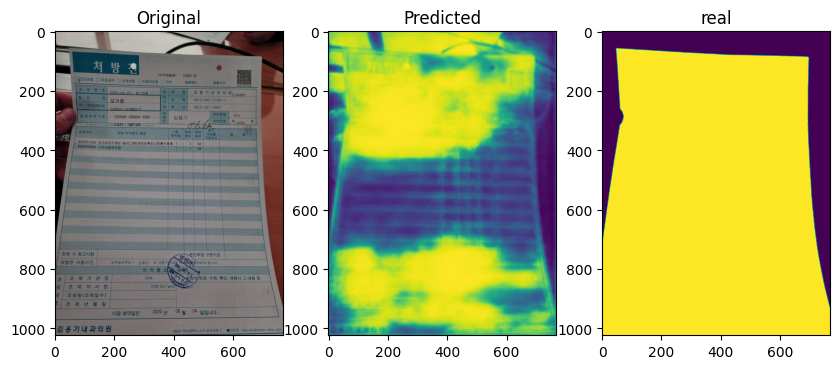

test_loss: 0.19528 -- Best loss: 0.19528 --- 91.52 seconds
cur_lr: 0.001


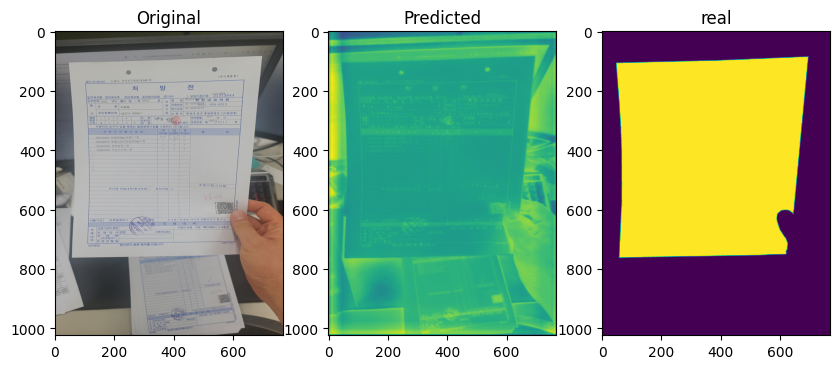

[ 2 / 2000] train_loss: 0.05765   test_loss: 0.17100 -- Best loss: 0.17100 --- 5.53 seconds
cur_lr: 0.001
[ 3 / 2000] train_loss: 0.04367   test_loss: 0.14865 -- Best loss: 0.14865 --- 4.77 seconds
cur_lr: 0.001
[ 4 / 2000] train_loss: 0.03726   test_loss: 0.13401 -- Best loss: 0.13401 --- 5.19 seconds
cur_lr: 0.001
[ 5 / 2000] train_loss: 0.05319   test_loss: 0.11228 -- Best loss: 0.11228 --- 4.00 seconds
cur_lr: 0.001
[ 6 / 2000] train_loss: 0.04341   test_loss: 0.10440 -- Best loss: 0.10440 --- 3.95 seconds
cur_lr: 0.001
[ 7 / 2000] train_loss: 0.03495   test_loss: 0.15218 -- Best loss: 0.10440 --- 3.74 seconds
cur_lr: 0.001
[ 8 / 2000] train_loss: 0.03690   test_loss: 0.07344 -- Best loss: 0.07344 --- 3.63 seconds
cur_lr: 0.001
[ 9 / 2000] train_loss: 0.03421   test_loss: 0.09158 -- Best loss: 0.07344 --- 3.85 seconds
cur_lr: 0.001
[10 / 2000] train_loss: 0.02771   test_loss: 0.05584 -- Best loss: 0.05584 --- 4.07 seconds
cur_lr: 0.001
[11 / 2000] train_loss: 0.02490   test_loss: 0

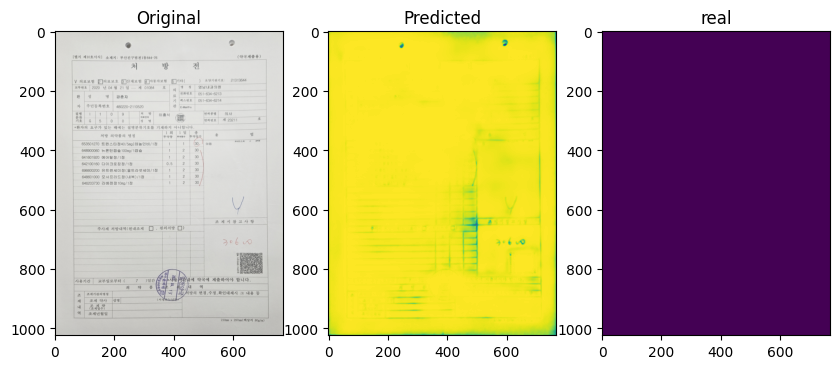

test_loss: 0.00856 -- Best loss: 0.00856 --- 3.56 seconds
cur_lr: 0.001


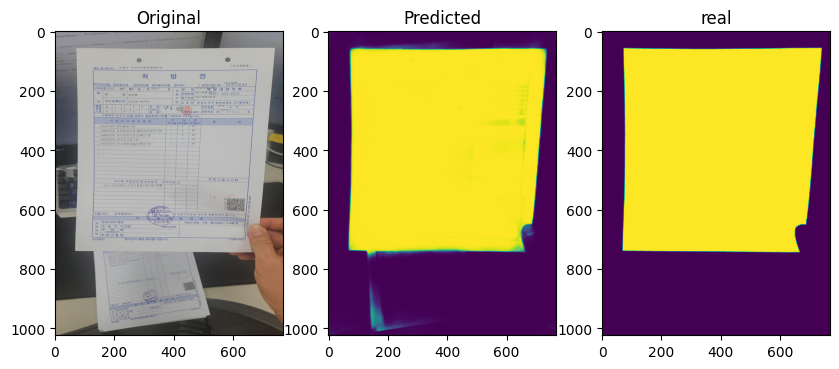

[52 / 2000] train_loss: 0.00931   test_loss: 0.00974 -- Best loss: 0.00856 --- 4.07 seconds
cur_lr: 0.001
[53 / 2000] train_loss: 0.00925   test_loss: 0.00793 -- Best loss: 0.00793 --- 3.57 seconds
cur_lr: 0.001
[54 / 2000] train_loss: 0.00716   test_loss: 0.00836 -- Best loss: 0.00793 --- 3.75 seconds
cur_lr: 0.001
[55 / 2000] train_loss: 0.00934   test_loss: 0.00828 -- Best loss: 0.00793 --- 3.94 seconds
cur_lr: 0.001
[56 / 2000] train_loss: 0.00788   test_loss: 0.00831 -- Best loss: 0.00793 --- 3.78 seconds
cur_lr: 0.001
[57 / 2000] train_loss: 0.00791   test_loss: 0.00755 -- Best loss: 0.00755 --- 3.55 seconds
cur_lr: 0.001
[58 / 2000] train_loss: 0.00738   test_loss: 0.01265 -- Best loss: 0.00755 --- 4.03 seconds
cur_lr: 0.001
[59 / 2000] train_loss: 0.00895   test_loss: 0.07601 -- Best loss: 0.00755 --- 3.71 seconds
cur_lr: 0.001
[60 / 2000] train_loss: 0.02180   test_loss: 0.02208 -- Best loss: 0.00755 --- 3.90 seconds
cur_lr: 0.001
[61 / 2000] train_loss: 0.01649   test_loss: 0

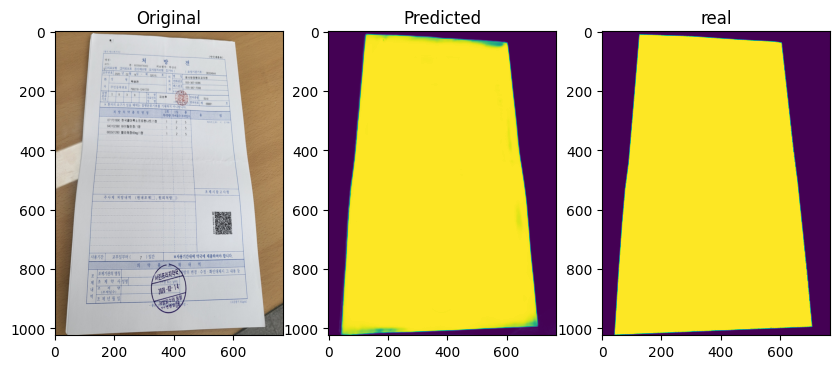

test_loss: 0.00613 -- Best loss: 0.00613 --- 3.94 seconds
cur_lr: 0.001


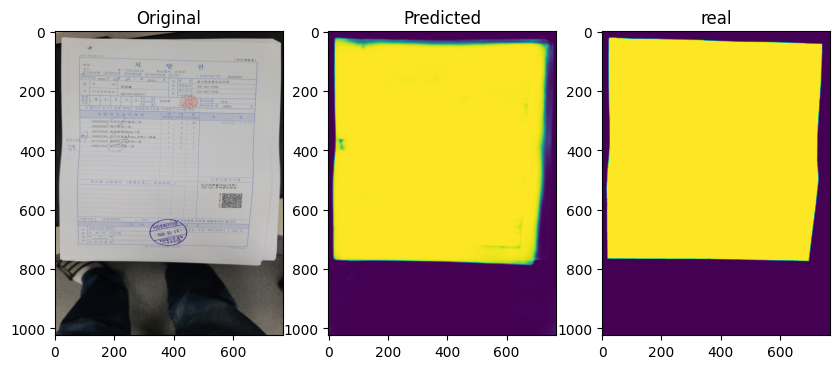

[102 / 2000] train_loss: 0.00433   test_loss: 0.00702 -- Best loss: 0.00613 --- 3.99 seconds
cur_lr: 0.001
[103 / 2000] train_loss: 0.00598   test_loss: 0.00645 -- Best loss: 0.00613 --- 3.99 seconds
cur_lr: 0.001
[104 / 2000] train_loss: 0.00503   test_loss: 0.00695 -- Best loss: 0.00613 --- 3.71 seconds
cur_lr: 0.001
[105 / 2000] train_loss: 0.00555   test_loss: 0.00633 -- Best loss: 0.00613 --- 3.86 seconds
cur_lr: 0.001
[106 / 2000] train_loss: 0.00468   test_loss: 0.01054 -- Best loss: 0.00613 --- 3.99 seconds
cur_lr: 0.001
[107 / 2000] train_loss: 0.00609   test_loss: 0.00766 -- Best loss: 0.00613 --- 3.70 seconds
cur_lr: 0.001
[108 / 2000] train_loss: 0.00467   test_loss: 0.00862 -- Best loss: 0.00613 --- 3.47 seconds
cur_lr: 0.001
[109 / 2000] train_loss: 0.00507   test_loss: 0.00794 -- Best loss: 0.00613 --- 3.75 seconds
cur_lr: 0.001
[110 / 2000] train_loss: 0.00488   test_loss: 0.00672 -- Best loss: 0.00613 --- 3.84 seconds
cur_lr: 0.001
[111 / 2000] train_loss: 0.00498   te

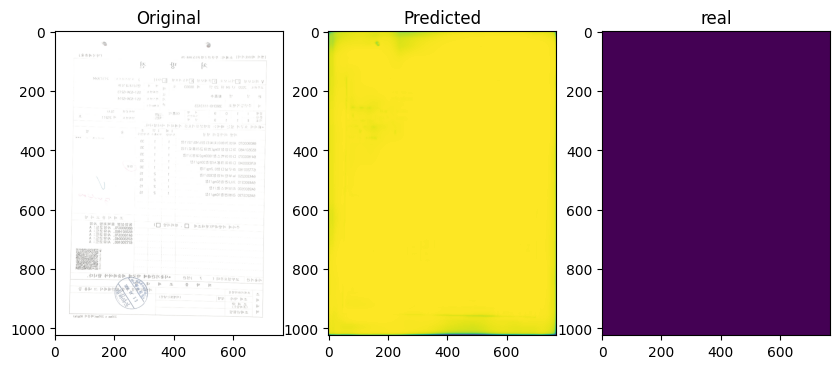

test_loss: 0.01327 -- Best loss: 0.00505 --- 3.62 seconds
cur_lr: 0.001


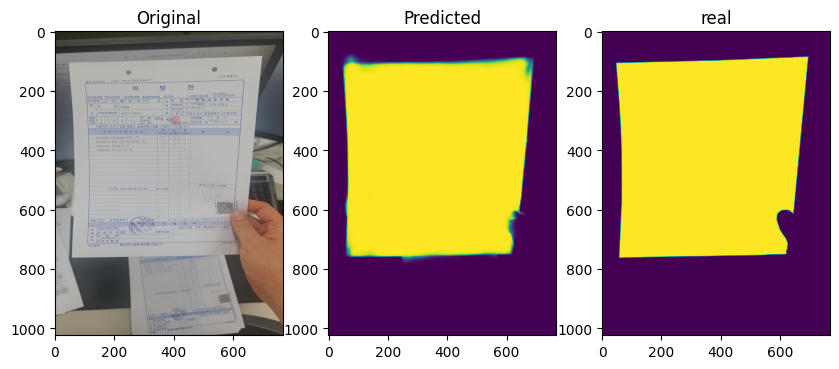

[152 / 2000] train_loss: 0.00806   test_loss: 0.01037 -- Best loss: 0.00505 --- 3.98 seconds
cur_lr: 0.001
[153 / 2000] train_loss: 0.00673   test_loss: 0.00896 -- Best loss: 0.00505 --- 4.03 seconds
cur_lr: 0.001
[154 / 2000] train_loss: 0.00656   test_loss: 0.01454 -- Best loss: 0.00505 --- 4.06 seconds
cur_lr: 0.001
[155 / 2000] train_loss: 0.00695   test_loss: 0.01448 -- Best loss: 0.00505 --- 4.16 seconds
cur_lr: 0.001
[156 / 2000] train_loss: 0.00676   test_loss: 0.00892 -- Best loss: 0.00505 --- 3.88 seconds
cur_lr: 0.001
[157 / 2000] train_loss: 0.00558   test_loss: 0.00729 -- Best loss: 0.00505 --- 3.70 seconds
cur_lr: 0.001
[158 / 2000] train_loss: 0.00511   test_loss: 0.00927 -- Best loss: 0.00505 --- 3.70 seconds
cur_lr: 0.001
[159 / 2000] train_loss: 0.00458   test_loss: 0.00628 -- Best loss: 0.00505 --- 3.52 seconds
cur_lr: 0.001
[160 / 2000] train_loss: 0.00417   test_loss: 0.00612 -- Best loss: 0.00505 --- 3.92 seconds
cur_lr: 0.001
[161 / 2000] train_loss: 0.00681   te

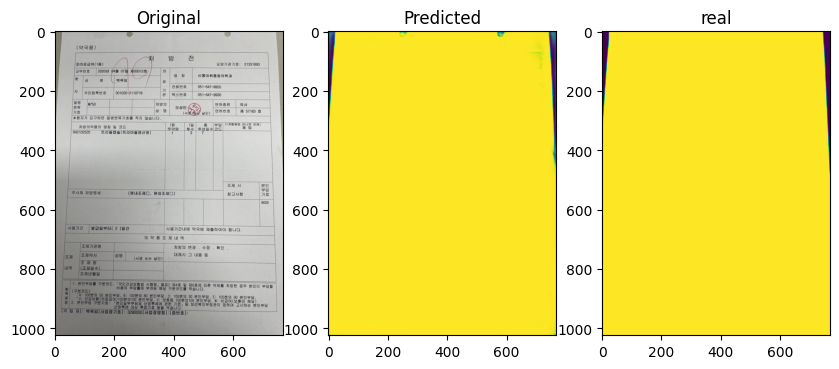

test_loss: 0.01132 -- Best loss: 0.00505 --- 3.72 seconds
cur_lr: 0.001


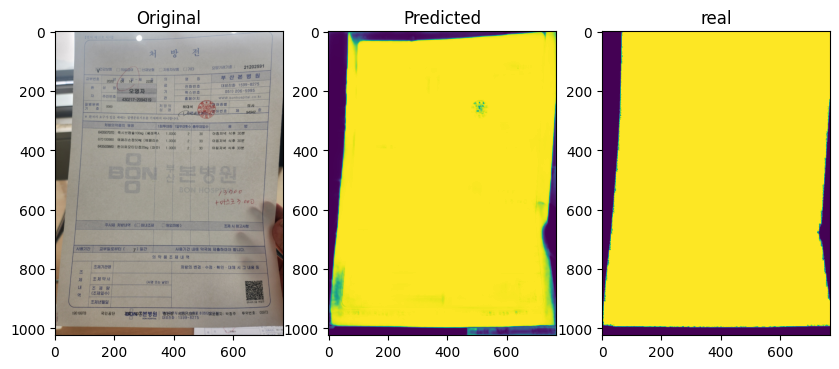

Epoch 00202: reducing learning rate of group 0 to 1.0000e-04.
[202 / 2000] train_loss: 0.00405   test_loss: 0.00582 -- Best loss: 0.00505 --- 3.68 seconds
cur_lr: 0.0001
[203 / 2000] train_loss: 0.00479   test_loss: 0.00553 -- Best loss: 0.00505 --- 3.26 seconds
cur_lr: 0.0001
[204 / 2000] train_loss: 0.00362   test_loss: 0.00524 -- Best loss: 0.00505 --- 3.89 seconds
cur_lr: 0.0001
[205 / 2000] train_loss: 0.00301   test_loss: 0.00526 -- Best loss: 0.00505 --- 4.18 seconds
cur_lr: 0.0001
[206 / 2000] train_loss: 0.00290   test_loss: 0.00533 -- Best loss: 0.00505 --- 3.48 seconds
cur_lr: 0.0001
[207 / 2000] train_loss: 0.00426   test_loss: 0.00538 -- Best loss: 0.00505 --- 3.92 seconds
cur_lr: 0.0001
[208 / 2000] train_loss: 0.00355   test_loss: 0.00525 -- Best loss: 0.00505 --- 3.54 seconds
cur_lr: 0.0001
[209 / 2000] train_loss: 0.00350   test_loss: 0.00532 -- Best loss: 0.00505 --- 3.95 seconds
cur_lr: 0.0001
[210 / 2000] train_loss: 0.00326   test_loss: 0.00536 -- Best loss: 0.0050

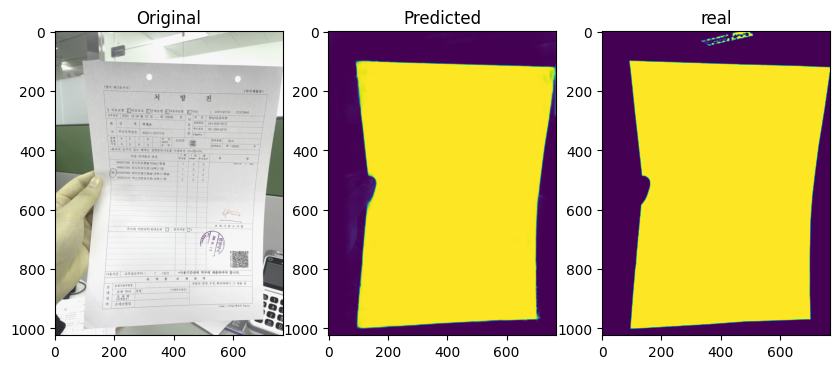

test_loss: 0.00448 -- Best loss: 0.00448 --- 3.67 seconds
cur_lr: 0.0001


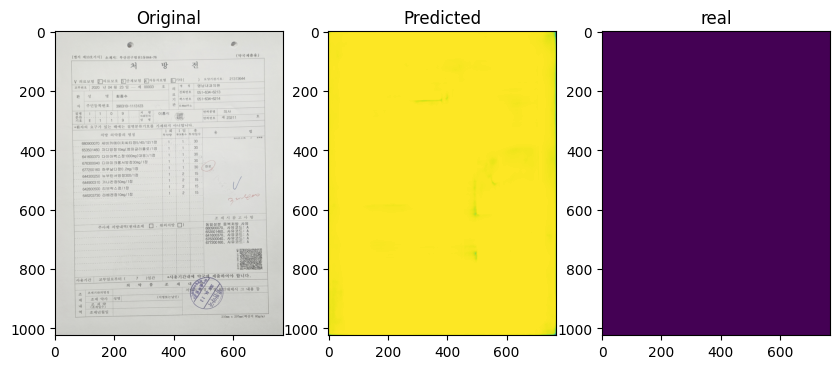

[252 / 2000] train_loss: 0.00310   test_loss: 0.00444 -- Best loss: 0.00444 --- 3.79 seconds
cur_lr: 0.0001
[253 / 2000] train_loss: 0.00292   test_loss: 0.00451 -- Best loss: 0.00444 --- 3.64 seconds
cur_lr: 0.0001
[254 / 2000] train_loss: 0.00365   test_loss: 0.00452 -- Best loss: 0.00444 --- 3.63 seconds
cur_lr: 0.0001
[255 / 2000] train_loss: 0.00270   test_loss: 0.00445 -- Best loss: 0.00444 --- 4.16 seconds
cur_lr: 0.0001
[256 / 2000] train_loss: 0.00285   test_loss: 0.00445 -- Best loss: 0.00444 --- 3.58 seconds
cur_lr: 0.0001
[257 / 2000] train_loss: 0.00298   test_loss: 0.00442 -- Best loss: 0.00442 --- 3.65 seconds
cur_lr: 0.0001
[258 / 2000] train_loss: 0.00358   test_loss: 0.00449 -- Best loss: 0.00442 --- 3.90 seconds
cur_lr: 0.0001
[259 / 2000] train_loss: 0.00250   test_loss: 0.00455 -- Best loss: 0.00442 --- 3.72 seconds
cur_lr: 0.0001
[260 / 2000] train_loss: 0.00344   test_loss: 0.00446 -- Best loss: 0.00442 --- 3.74 seconds
cur_lr: 0.0001
[261 / 2000] train_loss: 0.0

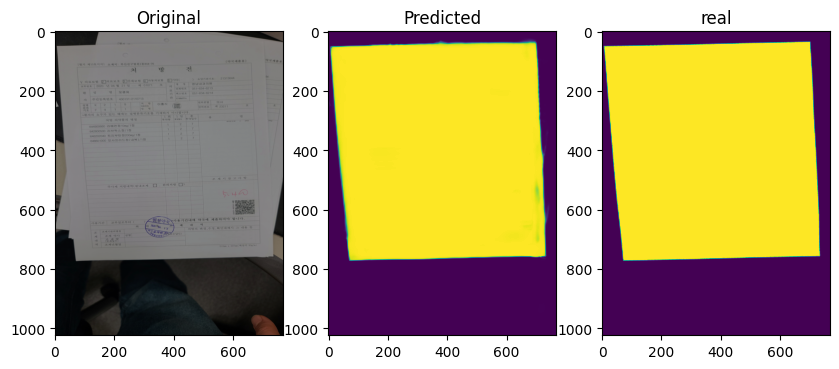

test_loss: 0.00438 -- Best loss: 0.00404 --- 3.67 seconds
cur_lr: 0.0001


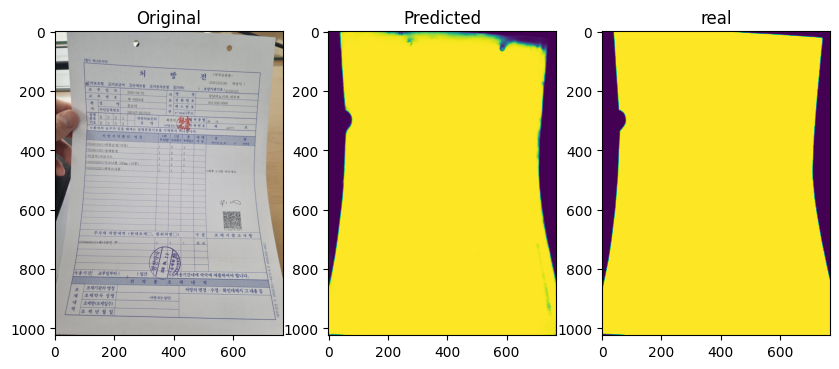

[302 / 2000] train_loss: 0.00259   test_loss: 0.00437 -- Best loss: 0.00404 --- 3.82 seconds
cur_lr: 0.0001
[303 / 2000] train_loss: 0.00360   test_loss: 0.00431 -- Best loss: 0.00404 --- 3.63 seconds
cur_lr: 0.0001
[304 / 2000] train_loss: 0.00268   test_loss: 0.00435 -- Best loss: 0.00404 --- 3.80 seconds
cur_lr: 0.0001
[305 / 2000] train_loss: 0.00279   test_loss: 0.00433 -- Best loss: 0.00404 --- 4.08 seconds
cur_lr: 0.0001
[306 / 2000] train_loss: 0.00300   test_loss: 0.00435 -- Best loss: 0.00404 --- 3.79 seconds
cur_lr: 0.0001
[307 / 2000] train_loss: 0.00254   test_loss: 0.00431 -- Best loss: 0.00404 --- 3.90 seconds
cur_lr: 0.0001
[308 / 2000] train_loss: 0.00286   test_loss: 0.00430 -- Best loss: 0.00404 --- 3.54 seconds
cur_lr: 0.0001
[309 / 2000] train_loss: 0.00297   test_loss: 0.00438 -- Best loss: 0.00404 --- 3.64 seconds
cur_lr: 0.0001
[310 / 2000] train_loss: 0.00262   test_loss: 0.00439 -- Best loss: 0.00404 --- 3.72 seconds
cur_lr: 0.0001
[311 / 2000] train_loss: 0.0

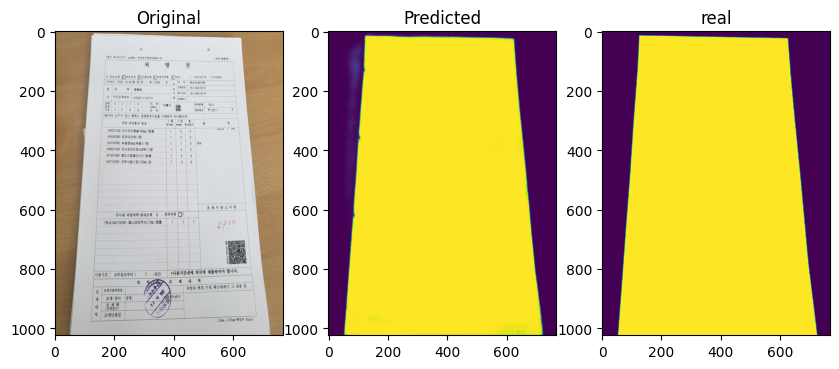

test_loss: 0.00406 -- Best loss: 0.00382 --- 3.58 seconds
cur_lr: 0.0001


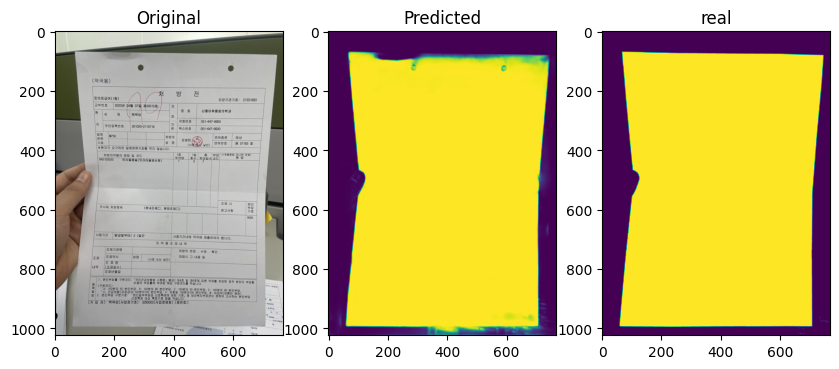

[352 / 2000] train_loss: 0.00286   test_loss: 0.00409 -- Best loss: 0.00382 --- 3.60 seconds
cur_lr: 0.0001
[353 / 2000] train_loss: 0.00252   test_loss: 0.00376 -- Best loss: 0.00376 --- 3.66 seconds
cur_lr: 0.0001
[354 / 2000] train_loss: 0.00306   test_loss: 0.00386 -- Best loss: 0.00376 --- 3.71 seconds
cur_lr: 0.0001
[355 / 2000] train_loss: 0.00274   test_loss: 0.00401 -- Best loss: 0.00376 --- 3.58 seconds
cur_lr: 0.0001
[356 / 2000] train_loss: 0.00239   test_loss: 0.00412 -- Best loss: 0.00376 --- 3.55 seconds
cur_lr: 0.0001
[357 / 2000] train_loss: 0.00774   test_loss: 0.00445 -- Best loss: 0.00376 --- 3.93 seconds
cur_lr: 0.0001
[358 / 2000] train_loss: 0.00320   test_loss: 0.00434 -- Best loss: 0.00376 --- 3.84 seconds
cur_lr: 0.0001
[359 / 2000] train_loss: 0.00270   test_loss: 0.00421 -- Best loss: 0.00376 --- 3.73 seconds
cur_lr: 0.0001
[360 / 2000] train_loss: 0.00305   test_loss: 0.00397 -- Best loss: 0.00376 --- 4.01 seconds
cur_lr: 0.0001
[361 / 2000] train_loss: 0.0

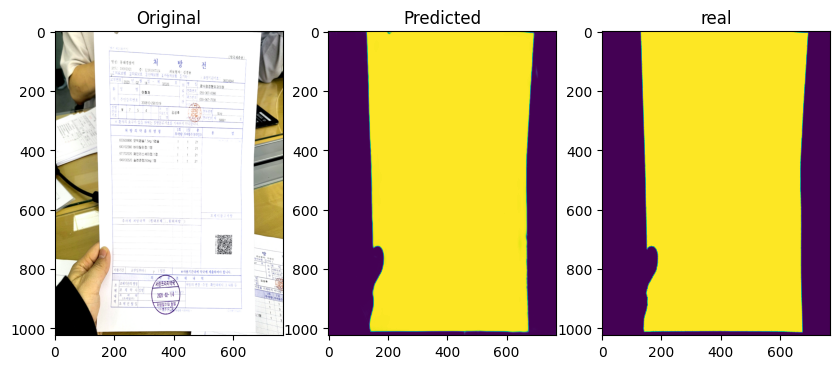

test_loss: 0.00428 -- Best loss: 0.00376 --- 3.60 seconds
cur_lr: 0.0001


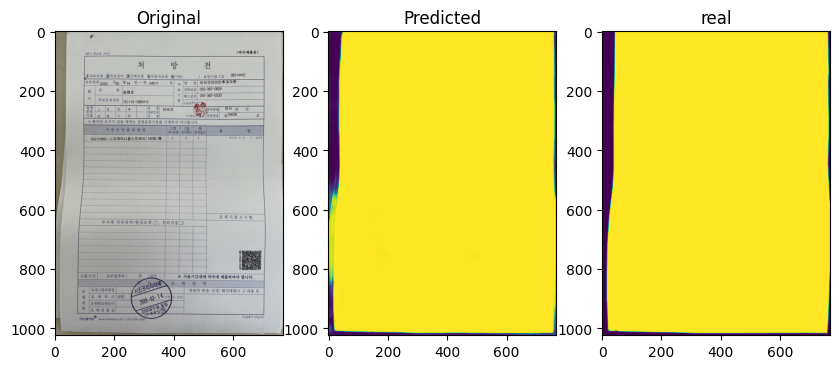

[402 / 2000] train_loss: 0.00214   test_loss: 0.00421 -- Best loss: 0.00376 --- 3.44 seconds
cur_lr: 0.0001
Epoch 00403: reducing learning rate of group 0 to 1.0000e-05.
[403 / 2000] train_loss: 0.00230   test_loss: 0.00426 -- Best loss: 0.00376 --- 3.44 seconds
cur_lr: 1e-05
[404 / 2000] train_loss: 0.00243   test_loss: 0.00424 -- Best loss: 0.00376 --- 3.89 seconds
cur_lr: 1e-05
[405 / 2000] train_loss: 0.00215   test_loss: 0.00421 -- Best loss: 0.00376 --- 3.81 seconds
cur_lr: 1e-05
[406 / 2000] train_loss: 0.00210   test_loss: 0.00417 -- Best loss: 0.00376 --- 3.75 seconds
cur_lr: 1e-05
[407 / 2000] train_loss: 0.00224   test_loss: 0.00416 -- Best loss: 0.00376 --- 3.68 seconds
cur_lr: 1e-05
[408 / 2000] train_loss: 0.00232   test_loss: 0.00422 -- Best loss: 0.00376 --- 3.79 seconds
cur_lr: 1e-05
[409 / 2000] train_loss: 0.00203   test_loss: 0.00425 -- Best loss: 0.00376 --- 3.58 seconds
cur_lr: 1e-05
[410 / 2000] train_loss: 0.00213   test_loss: 0.00432 -- Best loss: 0.00376 --- 3

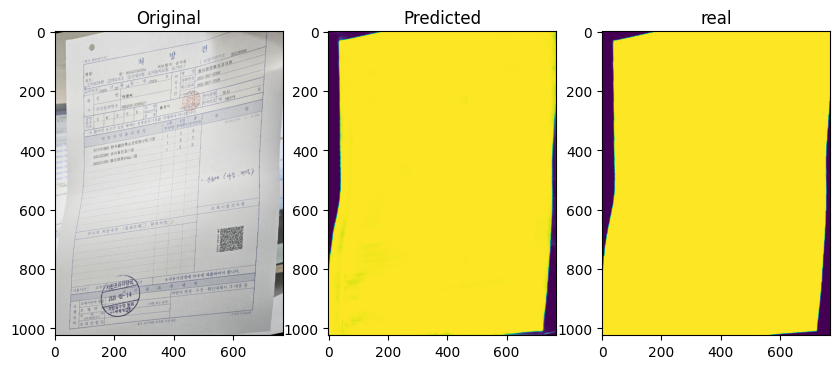

test_loss: 0.00415 -- Best loss: 0.00376 --- 4.00 seconds
cur_lr: 1e-05


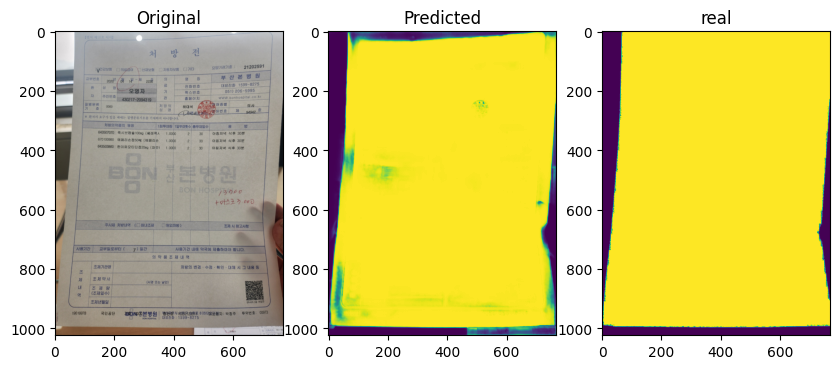

[452 / 2000] train_loss: 0.00197   test_loss: 0.00414 -- Best loss: 0.00376 --- 3.79 seconds
cur_lr: 1e-05
[453 / 2000] train_loss: 0.00228   test_loss: 0.00416 -- Best loss: 0.00376 --- 3.67 seconds
cur_lr: 1e-05
[454 / 2000] train_loss: 0.00226   test_loss: 0.00411 -- Best loss: 0.00376 --- 3.86 seconds
cur_lr: 1e-05
[455 / 2000] train_loss: 0.00201   test_loss: 0.00419 -- Best loss: 0.00376 --- 4.47 seconds
cur_lr: 1e-05
[456 / 2000] train_loss: 0.00214   test_loss: 0.00413 -- Best loss: 0.00376 --- 3.97 seconds
cur_lr: 1e-05
[457 / 2000] train_loss: 0.00224   test_loss: 0.00415 -- Best loss: 0.00376 --- 3.95 seconds
cur_lr: 1e-05
[458 / 2000] train_loss: 0.00218   test_loss: 0.00413 -- Best loss: 0.00376 --- 4.18 seconds
cur_lr: 1e-05
[459 / 2000] train_loss: 0.00270   test_loss: 0.00409 -- Best loss: 0.00376 --- 3.99 seconds
cur_lr: 1e-05
[460 / 2000] train_loss: 0.00212   test_loss: 0.00415 -- Best loss: 0.00376 --- 3.46 seconds
cur_lr: 1e-05
[461 / 2000] train_loss: 0.00228   te

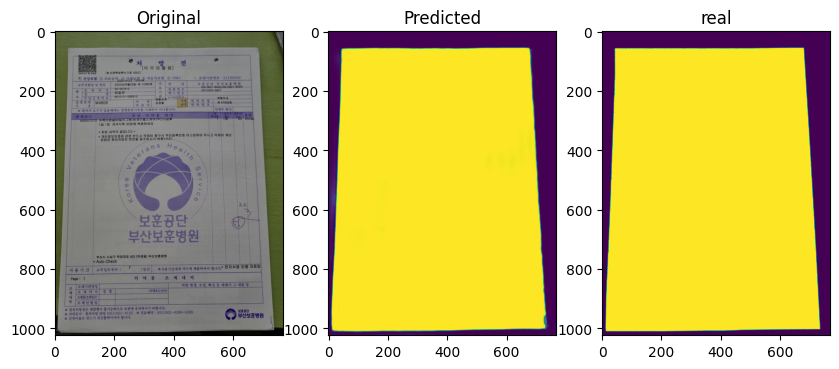

test_loss: 0.00403 -- Best loss: 0.00376 --- 4.13 seconds
cur_lr: 1e-05


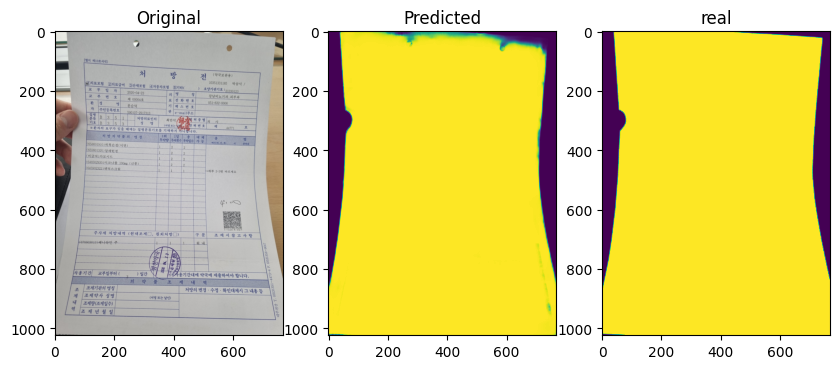

[502 / 2000] train_loss: 0.00209   test_loss: 0.00402 -- Best loss: 0.00376 --- 3.86 seconds
cur_lr: 1e-05
[503 / 2000] train_loss: 0.00200   test_loss: 0.00404 -- Best loss: 0.00376 --- 3.88 seconds
cur_lr: 1e-05
[504 / 2000] train_loss: 0.00202   test_loss: 0.00411 -- Best loss: 0.00376 --- 3.80 seconds
cur_lr: 1e-05
[505 / 2000] train_loss: 0.00251   test_loss: 0.00413 -- Best loss: 0.00376 --- 4.98 seconds
cur_lr: 1e-05
[506 / 2000] train_loss: 0.00223   test_loss: 0.00415 -- Best loss: 0.00376 --- 4.06 seconds
cur_lr: 1e-05
[507 / 2000] train_loss: 0.00208   test_loss: 0.00409 -- Best loss: 0.00376 --- 3.93 seconds
cur_lr: 1e-05
[508 / 2000] train_loss: 0.00197   test_loss: 0.00414 -- Best loss: 0.00376 --- 3.93 seconds
cur_lr: 1e-05
[509 / 2000] train_loss: 0.00188   test_loss: 0.00405 -- Best loss: 0.00376 --- 3.52 seconds
cur_lr: 1e-05
[510 / 2000] train_loss: 0.00192   test_loss: 0.00407 -- Best loss: 0.00376 --- 3.85 seconds
cur_lr: 1e-05
[511 / 2000] train_loss: 0.00230   te

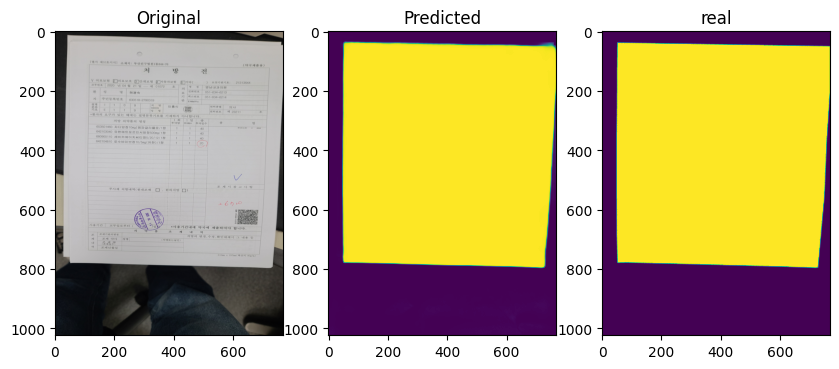

test_loss: 0.00413 -- Best loss: 0.00376 --- 3.66 seconds
cur_lr: 1e-05


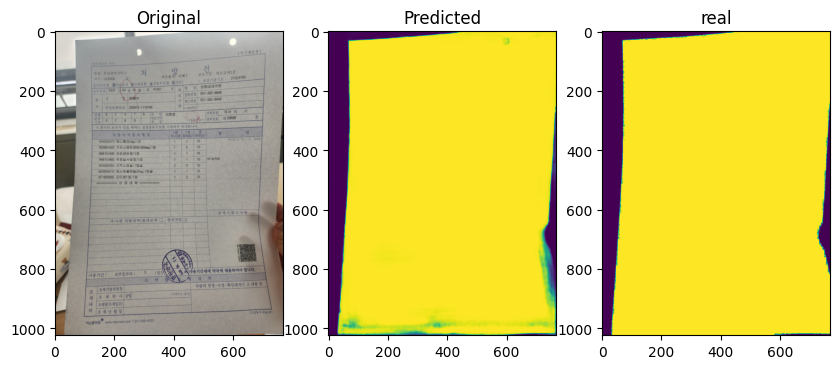

[552 / 2000] train_loss: 0.00224   test_loss: 0.00415 -- Best loss: 0.00376 --- 3.82 seconds
cur_lr: 1e-05
[553 / 2000] train_loss: 0.00201   test_loss: 0.00417 -- Best loss: 0.00376 --- 4.00 seconds
cur_lr: 1e-05
[554 / 2000] train_loss: 0.00244   test_loss: 0.00407 -- Best loss: 0.00376 --- 3.87 seconds
cur_lr: 1e-05
[555 / 2000] train_loss: 0.00252   test_loss: 0.00405 -- Best loss: 0.00376 --- 3.78 seconds
cur_lr: 1e-05
[556 / 2000] train_loss: 0.00215   test_loss: 0.00405 -- Best loss: 0.00376 --- 3.77 seconds
cur_lr: 1e-05
[557 / 2000] train_loss: 0.00186   test_loss: 0.00407 -- Best loss: 0.00376 --- 3.74 seconds
cur_lr: 1e-05
[558 / 2000] train_loss: 0.00221   test_loss: 0.00400 -- Best loss: 0.00376 --- 3.82 seconds
cur_lr: 1e-05
[559 / 2000] train_loss: 0.00205   test_loss: 0.00405 -- Best loss: 0.00376 --- 3.70 seconds
cur_lr: 1e-05
[560 / 2000] train_loss: 0.00221   test_loss: 0.00405 -- Best loss: 0.00376 --- 3.73 seconds
cur_lr: 1e-05
[561 / 2000] train_loss: 0.00235   te

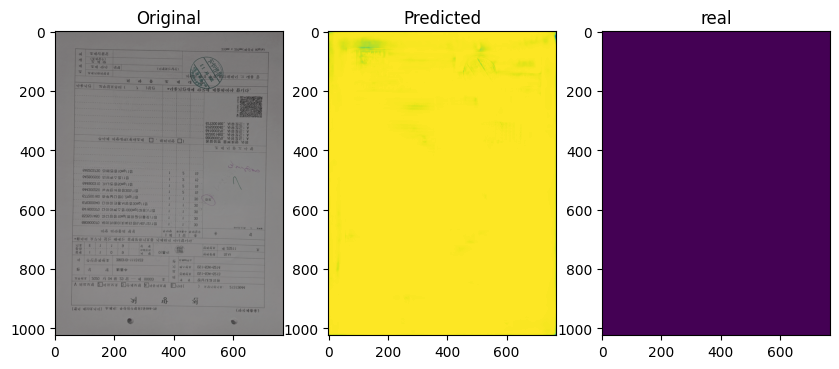

test_loss: 0.00397 -- Best loss: 0.00376 --- 3.91 seconds
cur_lr: 1e-05


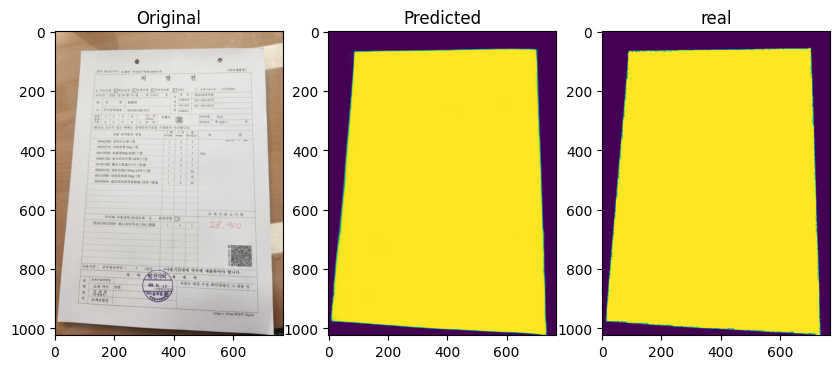

[602 / 2000] train_loss: 0.00202   test_loss: 0.00395 -- Best loss: 0.00376 --- 3.71 seconds
cur_lr: 1e-05
[603 / 2000] train_loss: 0.00262   test_loss: 0.00402 -- Best loss: 0.00376 --- 3.50 seconds
cur_lr: 1e-05
Epoch 00604: reducing learning rate of group 0 to 1.0000e-06.
[604 / 2000] train_loss: 0.00184   test_loss: 0.00398 -- Best loss: 0.00376 --- 3.75 seconds
cur_lr: 1.0000000000000002e-06
[605 / 2000] train_loss: 0.00192   test_loss: 0.00393 -- Best loss: 0.00376 --- 4.06 seconds
cur_lr: 1.0000000000000002e-06
[606 / 2000] train_loss: 0.00232   test_loss: 0.00399 -- Best loss: 0.00376 --- 3.66 seconds
cur_lr: 1.0000000000000002e-06
[607 / 2000] train_loss: 0.00224   test_loss: 0.00395 -- Best loss: 0.00376 --- 3.54 seconds
cur_lr: 1.0000000000000002e-06
[608 / 2000] train_loss: 0.00190   test_loss: 0.00394 -- Best loss: 0.00376 --- 3.69 seconds
cur_lr: 1.0000000000000002e-06
[609 / 2000] train_loss: 0.00205   test_loss: 0.00397 -- Best loss: 0.00376 --- 3.64 seconds
cur_lr: 1.0

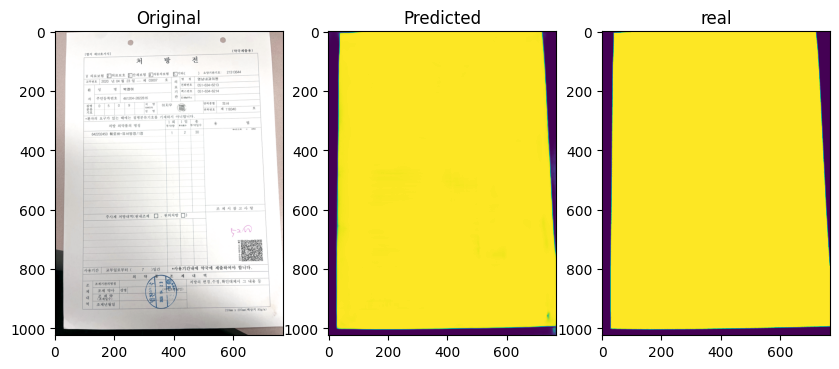

test_loss: 0.00390 -- Best loss: 0.00376 --- 3.94 seconds
cur_lr: 1.0000000000000002e-06


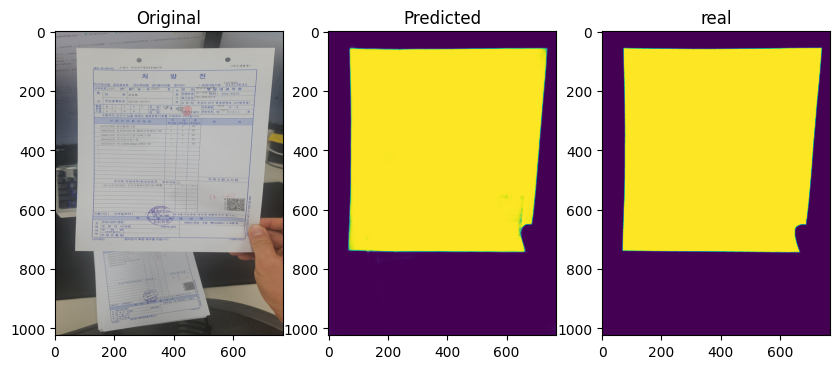

[652 / 2000] train_loss: 0.00195   test_loss: 0.00388 -- Best loss: 0.00376 --- 3.74 seconds
cur_lr: 1.0000000000000002e-06
[653 / 2000] train_loss: 0.00260   test_loss: 0.00393 -- Best loss: 0.00376 --- 3.70 seconds
cur_lr: 1.0000000000000002e-06
[654 / 2000] train_loss: 0.00215   test_loss: 0.00395 -- Best loss: 0.00376 --- 3.33 seconds
cur_lr: 1.0000000000000002e-06
[655 / 2000] train_loss: 0.00221   test_loss: 0.00395 -- Best loss: 0.00376 --- 4.09 seconds
cur_lr: 1.0000000000000002e-06
[656 / 2000] train_loss: 0.00230   test_loss: 0.00402 -- Best loss: 0.00376 --- 3.55 seconds
cur_lr: 1.0000000000000002e-06
[657 / 2000] train_loss: 0.00236   test_loss: 0.00402 -- Best loss: 0.00376 --- 3.58 seconds
cur_lr: 1.0000000000000002e-06
[658 / 2000] train_loss: 0.00240   test_loss: 0.00397 -- Best loss: 0.00376 --- 3.83 seconds
cur_lr: 1.0000000000000002e-06
[659 / 2000] train_loss: 0.00226   test_loss: 0.00398 -- Best loss: 0.00376 --- 3.86 seconds
cur_lr: 1.0000000000000002e-06
[660 / 2

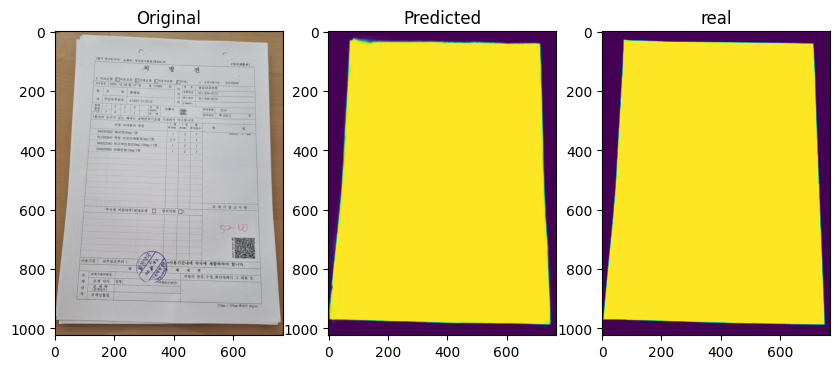

test_loss: 0.00394 -- Best loss: 0.00376 --- 3.65 seconds
cur_lr: 1.0000000000000002e-06


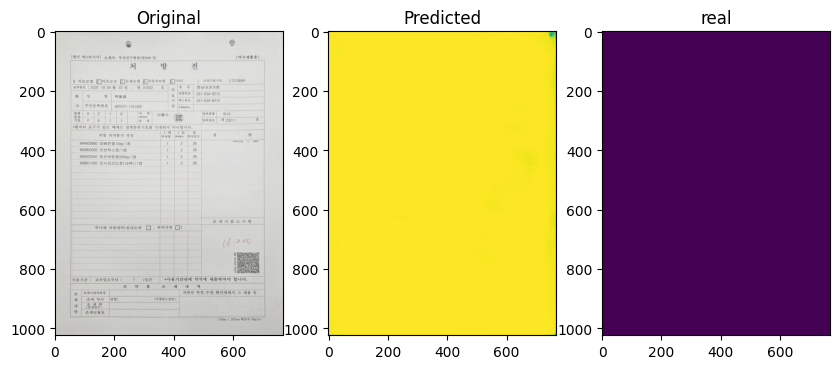

[702 / 2000] train_loss: 0.00218   test_loss: 0.00394 -- Best loss: 0.00376 --- 3.72 seconds
cur_lr: 1.0000000000000002e-06
[703 / 2000] train_loss: 0.00267   test_loss: 0.00395 -- Best loss: 0.00376 --- 3.73 seconds
cur_lr: 1.0000000000000002e-06
[704 / 2000] train_loss: 0.00257   test_loss: 0.00402 -- Best loss: 0.00376 --- 3.79 seconds
cur_lr: 1.0000000000000002e-06
[705 / 2000] train_loss: 0.00385   test_loss: 0.00409 -- Best loss: 0.00376 --- 4.17 seconds
cur_lr: 1.0000000000000002e-06
[706 / 2000] train_loss: 0.00226   test_loss: 0.00405 -- Best loss: 0.00376 --- 3.84 seconds
cur_lr: 1.0000000000000002e-06
[707 / 2000] train_loss: 0.00192   test_loss: 0.00400 -- Best loss: 0.00376 --- 3.25 seconds
cur_lr: 1.0000000000000002e-06
[708 / 2000] train_loss: 0.00219   test_loss: 0.00395 -- Best loss: 0.00376 --- 3.56 seconds
cur_lr: 1.0000000000000002e-06
[709 / 2000] train_loss: 0.00200   test_loss: 0.00397 -- Best loss: 0.00376 --- 3.38 seconds
cur_lr: 1.0000000000000002e-06
[710 / 2

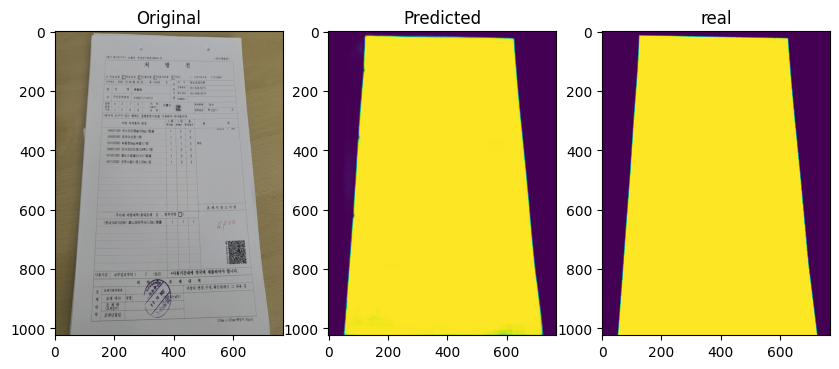

test_loss: 0.00400 -- Best loss: 0.00376 --- 3.77 seconds
cur_lr: 1.0000000000000002e-06


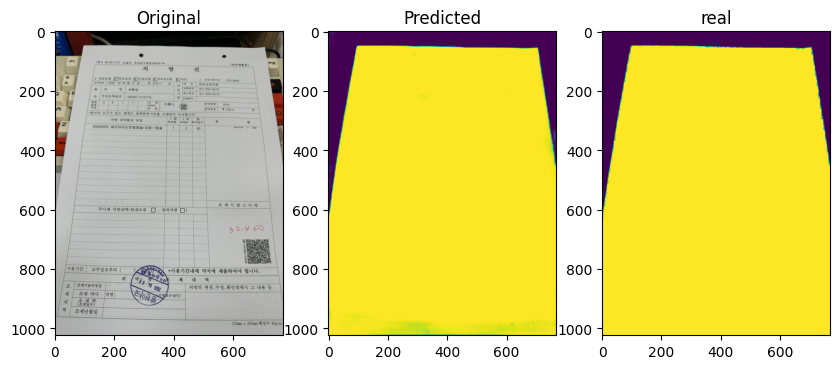

[752 / 2000] train_loss: 0.00195   test_loss: 0.00401 -- Best loss: 0.00376 --- 3.85 seconds
cur_lr: 1.0000000000000002e-06
[753 / 2000] train_loss: 0.00314   test_loss: 0.00402 -- Best loss: 0.00376 --- 3.85 seconds
cur_lr: 1.0000000000000002e-06
[754 / 2000] train_loss: 0.00212   test_loss: 0.00402 -- Best loss: 0.00376 --- 3.92 seconds
cur_lr: 1.0000000000000002e-06
[755 / 2000] train_loss: 0.00258   test_loss: 0.00403 -- Best loss: 0.00376 --- 4.24 seconds
cur_lr: 1.0000000000000002e-06
[756 / 2000] train_loss: 0.00204   test_loss: 0.00401 -- Best loss: 0.00376 --- 3.91 seconds
cur_lr: 1.0000000000000002e-06
[757 / 2000] train_loss: 0.00226   test_loss: 0.00400 -- Best loss: 0.00376 --- 3.79 seconds
cur_lr: 1.0000000000000002e-06
[758 / 2000] train_loss: 0.00267   test_loss: 0.00401 -- Best loss: 0.00376 --- 3.43 seconds
cur_lr: 1.0000000000000002e-06
[759 / 2000] train_loss: 0.00211   test_loss: 0.00406 -- Best loss: 0.00376 --- 3.92 seconds
cur_lr: 1.0000000000000002e-06
[760 / 2

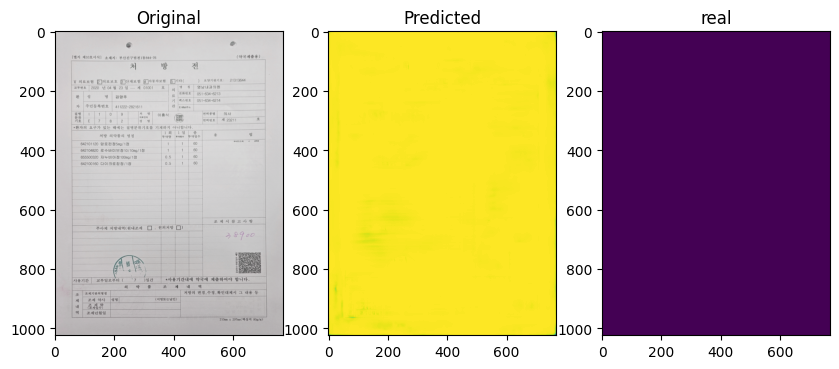

test_loss: 0.00400 -- Best loss: 0.00376 --- 3.79 seconds
cur_lr: 1.0000000000000002e-06


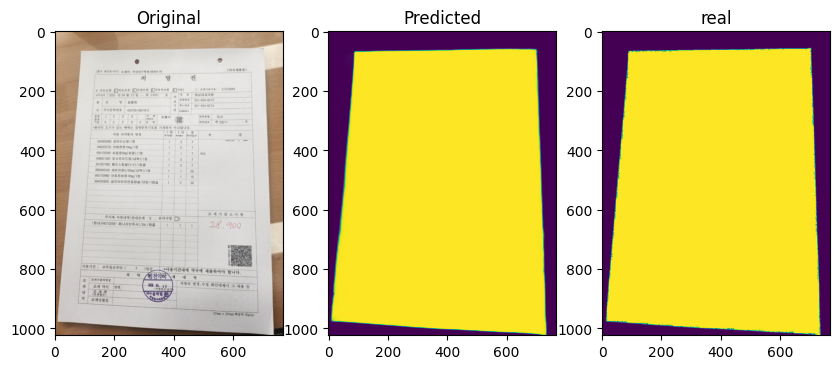

[802 / 2000] train_loss: 0.00295   test_loss: 0.00404 -- Best loss: 0.00376 --- 4.12 seconds
cur_lr: 1.0000000000000002e-06
[803 / 2000] train_loss: 0.00206   test_loss: 0.00398 -- Best loss: 0.00376 --- 3.75 seconds
cur_lr: 1.0000000000000002e-06
[804 / 2000] train_loss: 0.00365   test_loss: 0.00393 -- Best loss: 0.00376 --- 4.00 seconds
cur_lr: 1.0000000000000002e-06
Epoch 00805: reducing learning rate of group 0 to 1.0000e-07.
[805 / 2000] train_loss: 0.00210   test_loss: 0.00396 -- Best loss: 0.00376 --- 4.58 seconds
cur_lr: 1.0000000000000002e-07
[806 / 2000] train_loss: 0.00366   test_loss: 0.00401 -- Best loss: 0.00376 --- 3.81 seconds
cur_lr: 1.0000000000000002e-07
[807 / 2000] train_loss: 0.00226   test_loss: 0.00403 -- Best loss: 0.00376 --- 3.73 seconds
cur_lr: 1.0000000000000002e-07
[808 / 2000] train_loss: 0.00260   test_loss: 0.00402 -- Best loss: 0.00376 --- 3.83 seconds
cur_lr: 1.0000000000000002e-07
[809 / 2000] train_loss: 0.00217   test_loss: 0.00405 -- Best loss: 0.

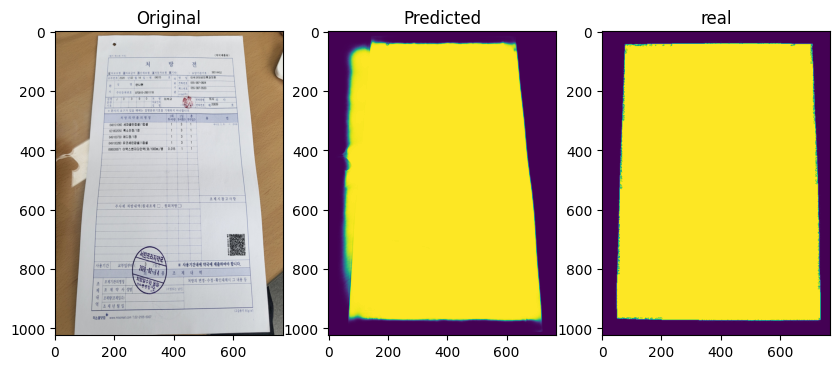

test_loss: 0.00393 -- Best loss: 0.00376 --- 3.83 seconds
cur_lr: 1.0000000000000002e-07


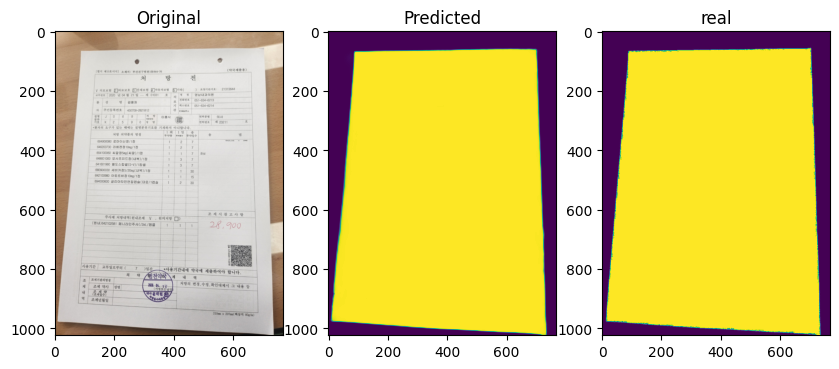

[852 / 2000] train_loss: 0.00299   test_loss: 0.00393 -- Best loss: 0.00376 --- 3.82 seconds
cur_lr: 1.0000000000000002e-07
[853 / 2000] train_loss: 0.00212   test_loss: 0.00391 -- Best loss: 0.00376 --- 3.72 seconds
cur_lr: 1.0000000000000002e-07
[854 / 2000] train_loss: 0.00244   test_loss: 0.00390 -- Best loss: 0.00376 --- 3.96 seconds
cur_lr: 1.0000000000000002e-07
[855 / 2000] train_loss: 0.00203   test_loss: 0.00394 -- Best loss: 0.00376 --- 4.00 seconds
cur_lr: 1.0000000000000002e-07
[856 / 2000] train_loss: 0.00237   test_loss: 0.00396 -- Best loss: 0.00376 --- 3.83 seconds
cur_lr: 1.0000000000000002e-07
[857 / 2000] train_loss: 0.00227   test_loss: 0.00386 -- Best loss: 0.00376 --- 3.54 seconds
cur_lr: 1.0000000000000002e-07
[858 / 2000] train_loss: 0.00223   test_loss: 0.00398 -- Best loss: 0.00376 --- 3.43 seconds
cur_lr: 1.0000000000000002e-07
[859 / 2000] train_loss: 0.00228   test_loss: 0.00395 -- Best loss: 0.00376 --- 3.84 seconds
cur_lr: 1.0000000000000002e-07
[860 / 2

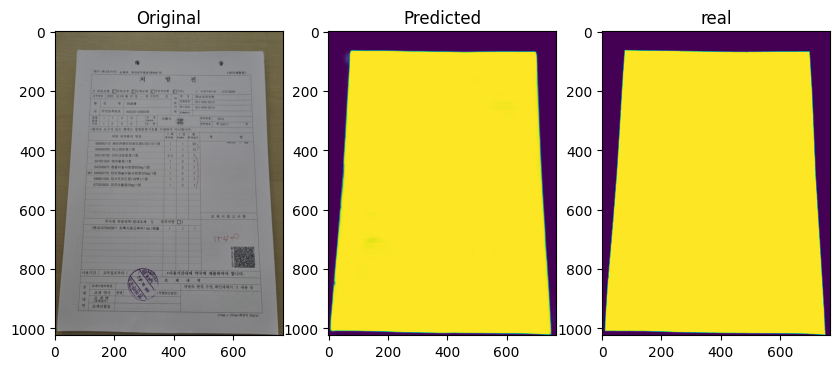

test_loss: 0.00403 -- Best loss: 0.00376 --- 3.47 seconds
cur_lr: 1.0000000000000002e-07


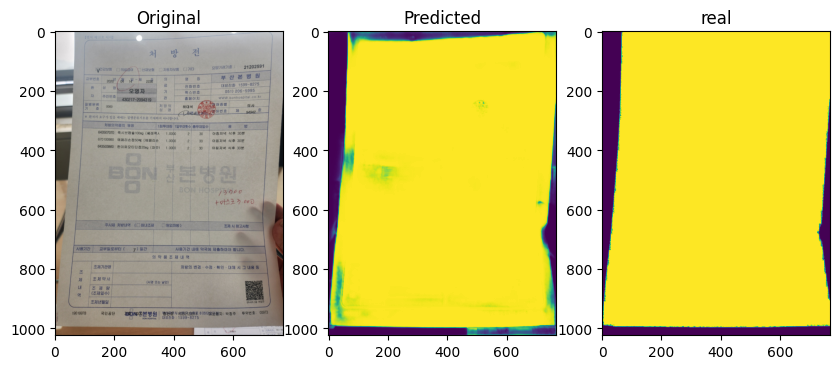

[902 / 2000] train_loss: 0.00231   test_loss: 0.00399 -- Best loss: 0.00376 --- 3.88 seconds
cur_lr: 1.0000000000000002e-07
[903 / 2000] train_loss: 0.00268   test_loss: 0.00402 -- Best loss: 0.00376 --- 3.89 seconds
cur_lr: 1.0000000000000002e-07
[904 / 2000] train_loss: 0.00258   test_loss: 0.00407 -- Best loss: 0.00376 --- 3.66 seconds
cur_lr: 1.0000000000000002e-07
[905 / 2000] train_loss: 0.00212   test_loss: 0.00406 -- Best loss: 0.00376 --- 4.14 seconds
cur_lr: 1.0000000000000002e-07
[906 / 2000] train_loss: 0.00206   test_loss: 0.00402 -- Best loss: 0.00376 --- 3.82 seconds
cur_lr: 1.0000000000000002e-07
[907 / 2000] train_loss: 0.00401   test_loss: 0.00404 -- Best loss: 0.00376 --- 3.82 seconds
cur_lr: 1.0000000000000002e-07
[908 / 2000] train_loss: 0.00336   test_loss: 0.00402 -- Best loss: 0.00376 --- 3.59 seconds
cur_lr: 1.0000000000000002e-07
[909 / 2000] train_loss: 0.00247   test_loss: 0.00409 -- Best loss: 0.00376 --- 3.86 seconds
cur_lr: 1.0000000000000002e-07
[910 / 2

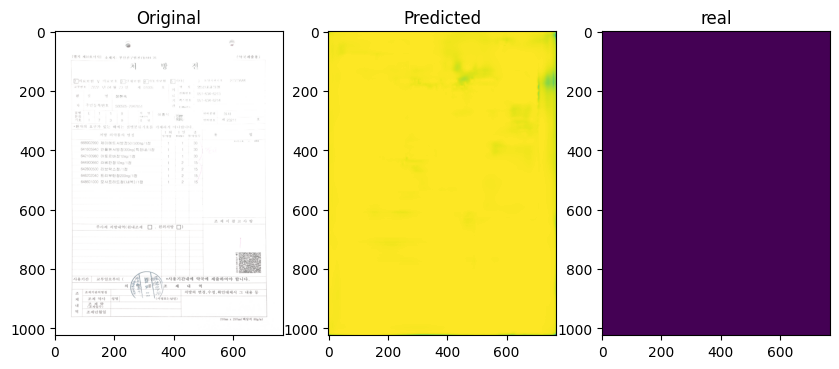

test_loss: 0.00405 -- Best loss: 0.00376 --- 3.67 seconds
cur_lr: 1.0000000000000002e-07


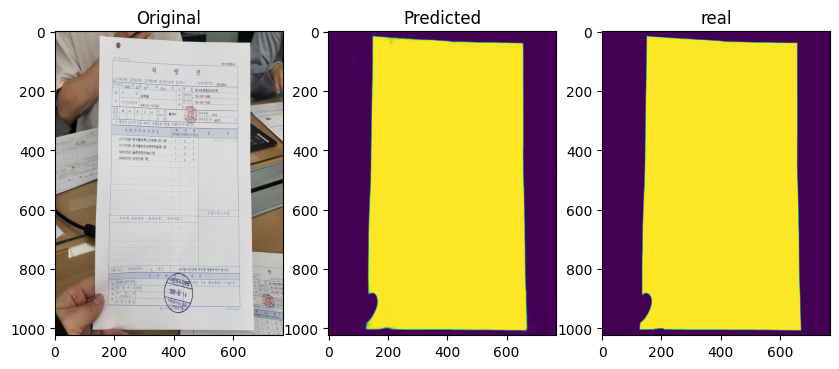

[952 / 2000] train_loss: 0.00221   test_loss: 0.00397 -- Best loss: 0.00376 --- 3.79 seconds
cur_lr: 1.0000000000000002e-07
[953 / 2000] train_loss: 0.00254   test_loss: 0.00395 -- Best loss: 0.00376 --- 3.64 seconds
cur_lr: 1.0000000000000002e-07
[954 / 2000] train_loss: 0.00215   test_loss: 0.00390 -- Best loss: 0.00376 --- 3.82 seconds
cur_lr: 1.0000000000000002e-07
[955 / 2000] train_loss: 0.00246   test_loss: 0.00399 -- Best loss: 0.00376 --- 3.74 seconds
cur_lr: 1.0000000000000002e-07
[956 / 2000] train_loss: 0.00256   test_loss: 0.00399 -- Best loss: 0.00376 --- 3.51 seconds
cur_lr: 1.0000000000000002e-07
[957 / 2000] train_loss: 0.00218   test_loss: 0.00397 -- Best loss: 0.00376 --- 3.53 seconds
cur_lr: 1.0000000000000002e-07
[958 / 2000] train_loss: 0.00206   test_loss: 0.00397 -- Best loss: 0.00376 --- 3.69 seconds
cur_lr: 1.0000000000000002e-07
[959 / 2000] train_loss: 0.00201   test_loss: 0.00397 -- Best loss: 0.00376 --- 3.77 seconds
cur_lr: 1.0000000000000002e-07
[960 / 2

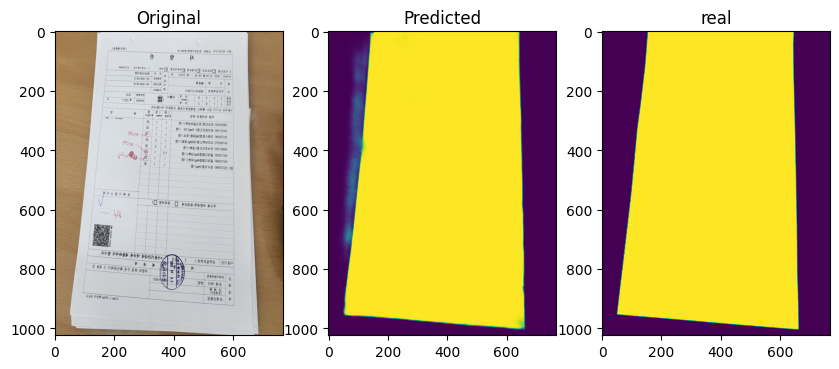

test_loss: 0.00394 -- Best loss: 0.00376 --- 3.68 seconds
cur_lr: 1.0000000000000002e-07


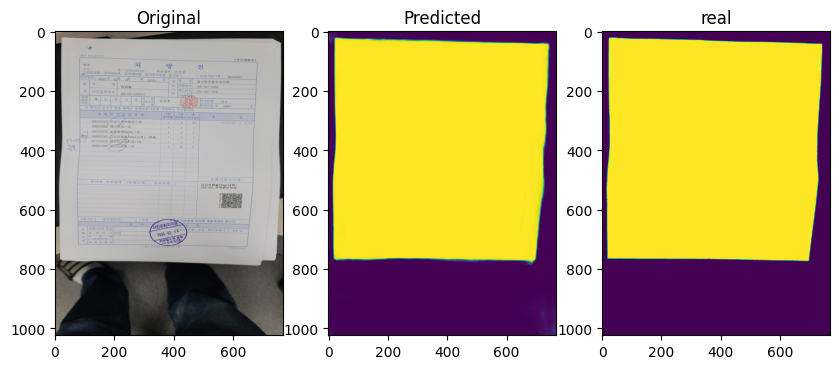

[1002 / 2000] train_loss: 0.00201   test_loss: 0.00403 -- Best loss: 0.00376 --- 3.72 seconds
cur_lr: 1.0000000000000002e-07
[1003 / 2000] train_loss: 0.00254   test_loss: 0.00402 -- Best loss: 0.00376 --- 3.51 seconds
cur_lr: 1.0000000000000002e-07
[1004 / 2000] train_loss: 0.00174   test_loss: 0.00397 -- Best loss: 0.00376 --- 3.65 seconds
cur_lr: 1.0000000000000002e-07
[1005 / 2000] train_loss: 0.00247   test_loss: 0.00399 -- Best loss: 0.00376 --- 4.03 seconds
cur_lr: 1.0000000000000002e-07
Epoch 01006: reducing learning rate of group 0 to 1.0000e-08.
[1006 / 2000] train_loss: 0.00191   test_loss: 0.00404 -- Best loss: 0.00376 --- 3.70 seconds
cur_lr: 1.0000000000000004e-08
[1007 / 2000] train_loss: 0.00224   test_loss: 0.00406 -- Best loss: 0.00376 --- 3.64 seconds
cur_lr: 1.0000000000000004e-08
[1008 / 2000] train_loss: 0.00219   test_loss: 0.00405 -- Best loss: 0.00376 --- 3.92 seconds
cur_lr: 1.0000000000000004e-08
[1009 / 2000] train_loss: 0.00248   test_loss: 0.00402 -- Best 

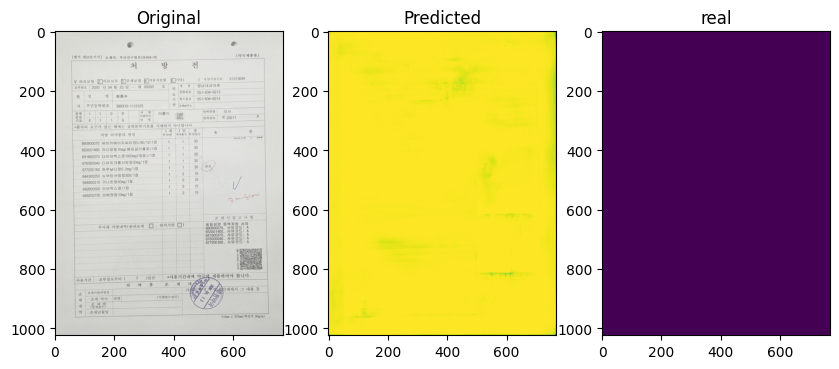

test_loss: 0.00404 -- Best loss: 0.00376 --- 3.56 seconds
cur_lr: 1.0000000000000004e-08


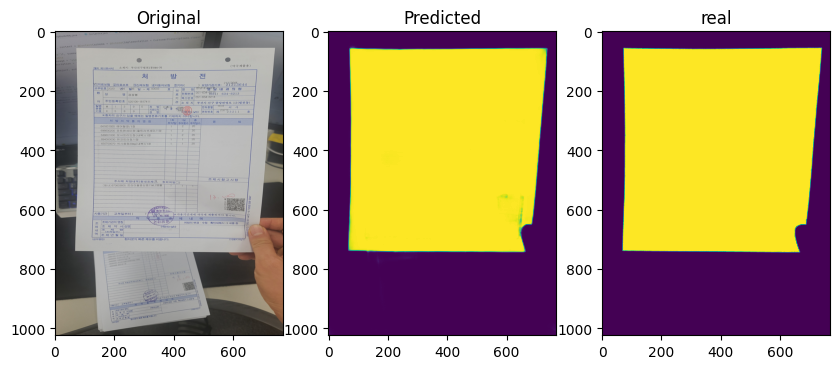

[1052 / 2000] train_loss: 0.00215   test_loss: 0.00397 -- Best loss: 0.00376 --- 4.46 seconds
cur_lr: 1.0000000000000004e-08
[1053 / 2000] train_loss: 0.00231   test_loss: 0.00404 -- Best loss: 0.00376 --- 4.24 seconds
cur_lr: 1.0000000000000004e-08
[1054 / 2000] train_loss: 0.00273   test_loss: 0.00401 -- Best loss: 0.00376 --- 4.79 seconds
cur_lr: 1.0000000000000004e-08
[1055 / 2000] train_loss: 0.00236   test_loss: 0.00403 -- Best loss: 0.00376 --- 5.70 seconds
cur_lr: 1.0000000000000004e-08
[1056 / 2000] train_loss: 0.00194   test_loss: 0.00398 -- Best loss: 0.00376 --- 4.76 seconds
cur_lr: 1.0000000000000004e-08
[1057 / 2000] train_loss: 0.00252   test_loss: 0.00407 -- Best loss: 0.00376 --- 4.47 seconds
cur_lr: 1.0000000000000004e-08
[1058 / 2000] train_loss: 0.00251   test_loss: 0.00406 -- Best loss: 0.00376 --- 3.95 seconds
cur_lr: 1.0000000000000004e-08
[1059 / 2000] train_loss: 0.00200   test_loss: 0.00402 -- Best loss: 0.00376 --- 3.55 seconds
cur_lr: 1.0000000000000004e-08


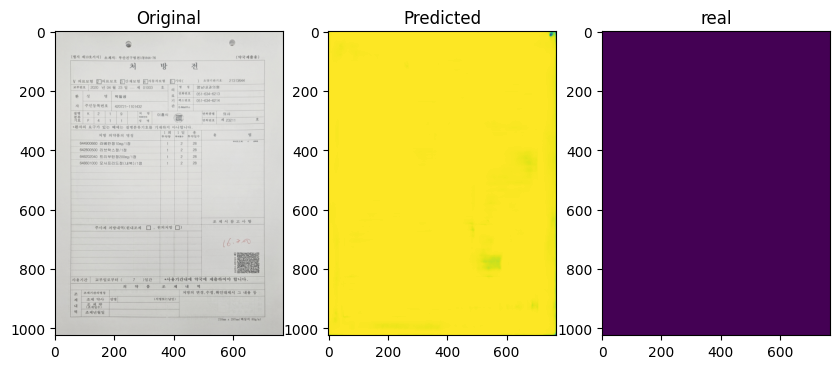

test_loss: 0.00399 -- Best loss: 0.00376 --- 3.46 seconds
cur_lr: 1.0000000000000004e-08


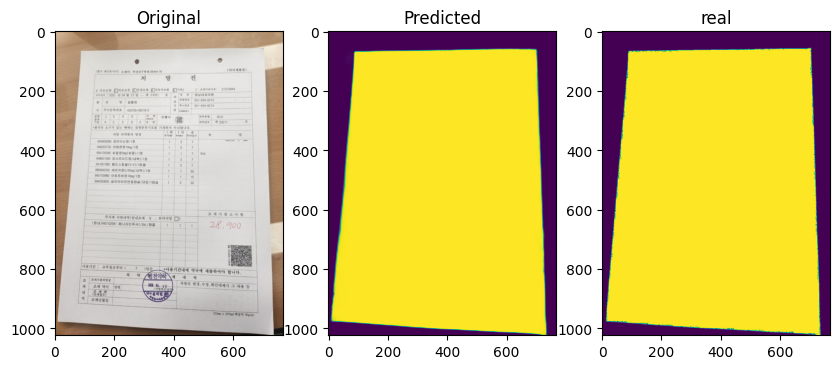

[1102 / 2000] train_loss: 0.00202   test_loss: 0.00407 -- Best loss: 0.00376 --- 3.63 seconds
cur_lr: 1.0000000000000004e-08
[1103 / 2000] train_loss: 0.00233   test_loss: 0.00403 -- Best loss: 0.00376 --- 3.82 seconds
cur_lr: 1.0000000000000004e-08
[1104 / 2000] train_loss: 0.00418   test_loss: 0.00398 -- Best loss: 0.00376 --- 3.79 seconds
cur_lr: 1.0000000000000004e-08
[1105 / 2000] train_loss: 0.00265   test_loss: 0.00399 -- Best loss: 0.00376 --- 4.24 seconds
cur_lr: 1.0000000000000004e-08
[1106 / 2000] train_loss: 0.00198   test_loss: 0.00394 -- Best loss: 0.00376 --- 3.82 seconds
cur_lr: 1.0000000000000004e-08
[1107 / 2000] train_loss: 0.00256   test_loss: 0.00402 -- Best loss: 0.00376 --- 3.65 seconds
cur_lr: 1.0000000000000004e-08
[1108 / 2000] train_loss: 0.00189   test_loss: 0.00403 -- Best loss: 0.00376 --- 3.76 seconds
cur_lr: 1.0000000000000004e-08
[1109 / 2000] train_loss: 0.00228   test_loss: 0.00402 -- Best loss: 0.00376 --- 3.61 seconds
cur_lr: 1.0000000000000004e-08


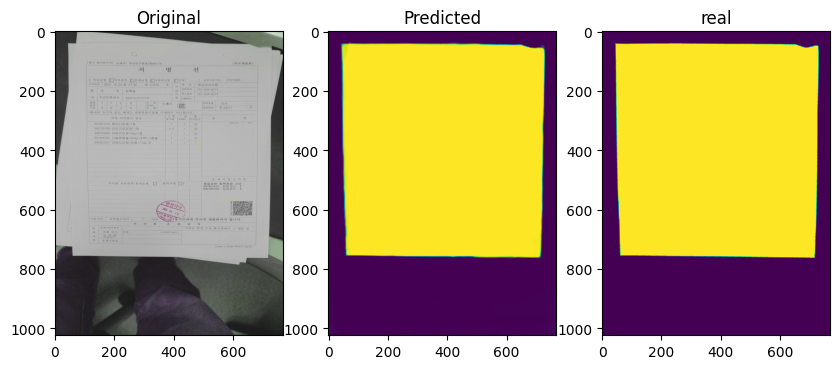

test_loss: 0.00393 -- Best loss: 0.00376 --- 3.66 seconds
cur_lr: 1.0000000000000004e-08


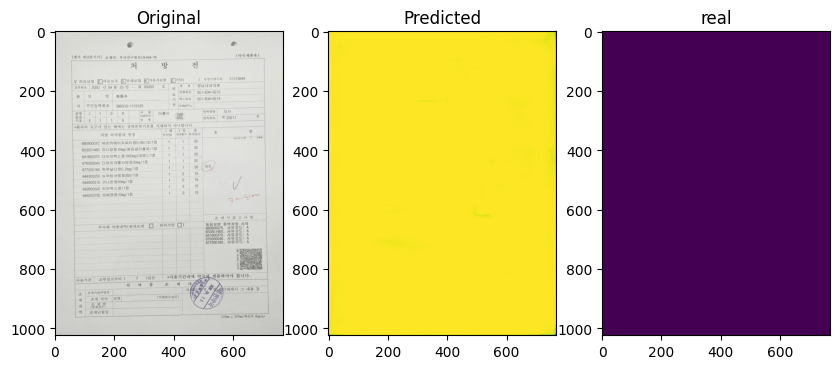

[1152 / 2000] train_loss: 0.00243   test_loss: 0.00401 -- Best loss: 0.00376 --- 3.79 seconds
cur_lr: 1.0000000000000004e-08
[1153 / 2000] train_loss: 0.00205   test_loss: 0.00398 -- Best loss: 0.00376 --- 3.38 seconds
cur_lr: 1.0000000000000004e-08
[1154 / 2000] train_loss: 0.00211   test_loss: 0.00404 -- Best loss: 0.00376 --- 4.00 seconds
cur_lr: 1.0000000000000004e-08
[1155 / 2000] train_loss: 0.00200   test_loss: 0.00401 -- Best loss: 0.00376 --- 3.99 seconds
cur_lr: 1.0000000000000004e-08
[1156 / 2000] train_loss: 0.00213   test_loss: 0.00396 -- Best loss: 0.00376 --- 3.69 seconds
cur_lr: 1.0000000000000004e-08
[1157 / 2000] train_loss: 0.00224   test_loss: 0.00399 -- Best loss: 0.00376 --- 3.78 seconds
cur_lr: 1.0000000000000004e-08
[1158 / 2000] train_loss: 0.00253   test_loss: 0.00394 -- Best loss: 0.00376 --- 3.80 seconds
cur_lr: 1.0000000000000004e-08
[1159 / 2000] train_loss: 0.00200   test_loss: 0.00393 -- Best loss: 0.00376 --- 3.67 seconds
cur_lr: 1.0000000000000004e-08


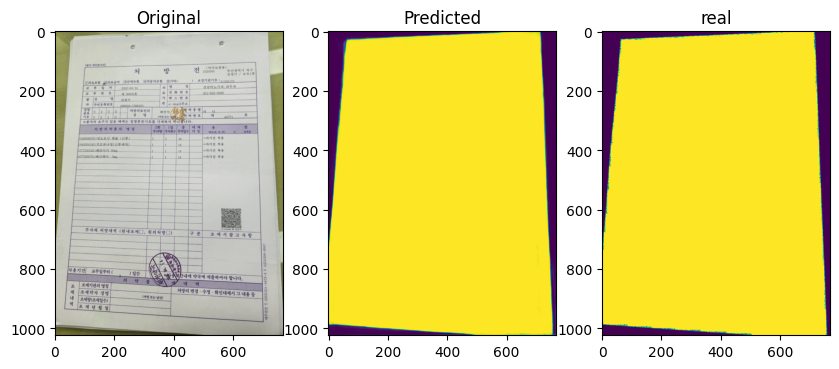

test_loss: 0.00395 -- Best loss: 0.00376 --- 3.76 seconds
cur_lr: 1.0000000000000004e-08


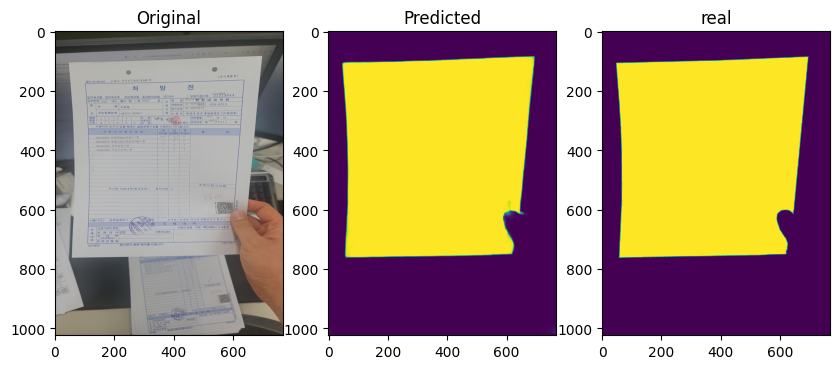

[1202 / 2000] train_loss: 0.00249   test_loss: 0.00397 -- Best loss: 0.00376 --- 3.82 seconds
cur_lr: 1.0000000000000004e-08
[1203 / 2000] train_loss: 0.00202   test_loss: 0.00406 -- Best loss: 0.00376 --- 3.69 seconds
cur_lr: 1.0000000000000004e-08
[1204 / 2000] train_loss: 0.00196   test_loss: 0.00406 -- Best loss: 0.00376 --- 3.67 seconds
cur_lr: 1.0000000000000004e-08
[1205 / 2000] train_loss: 0.00284   test_loss: 0.00405 -- Best loss: 0.00376 --- 4.03 seconds
cur_lr: 1.0000000000000004e-08
[1206 / 2000] train_loss: 0.00206   test_loss: 0.00402 -- Best loss: 0.00376 --- 4.09 seconds
cur_lr: 1.0000000000000004e-08
[1207 / 2000] train_loss: 0.00264   test_loss: 0.00404 -- Best loss: 0.00376 --- 3.73 seconds
cur_lr: 1.0000000000000004e-08
[1208 / 2000] train_loss: 0.00203   test_loss: 0.00400 -- Best loss: 0.00376 --- 4.14 seconds
cur_lr: 1.0000000000000004e-08
[1209 / 2000] train_loss: 0.00217   test_loss: 0.00399 -- Best loss: 0.00376 --- 3.92 seconds
cur_lr: 1.0000000000000004e-08


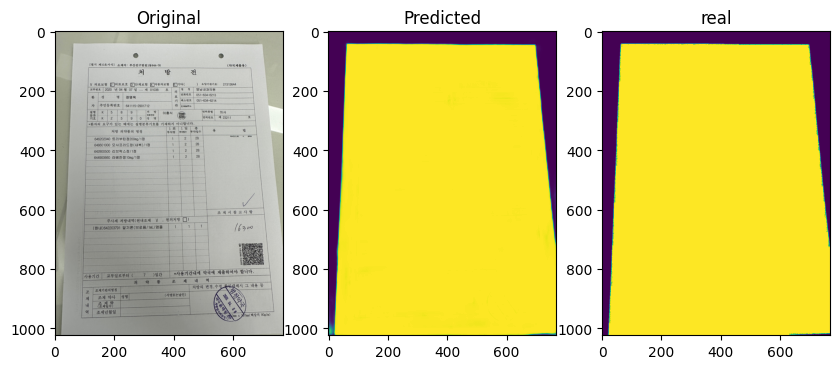

test_loss: 0.00394 -- Best loss: 0.00376 --- 3.79 seconds
cur_lr: 1.0000000000000004e-08


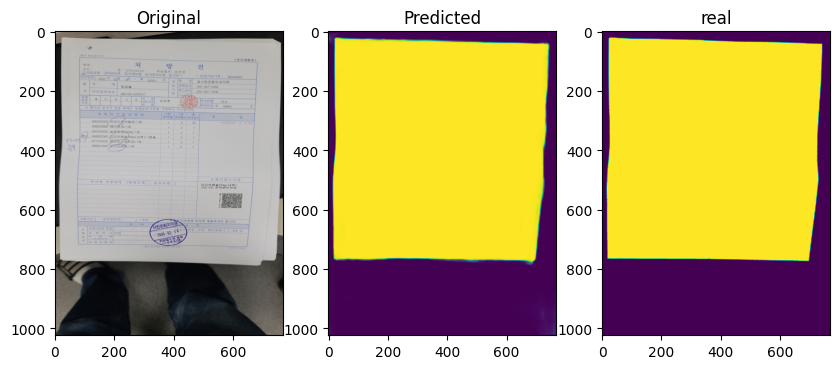

[1252 / 2000] train_loss: 0.00233   test_loss: 0.00398 -- Best loss: 0.00376 --- 3.71 seconds
cur_lr: 1.0000000000000004e-08
[1253 / 2000] train_loss: 0.00191   test_loss: 0.00399 -- Best loss: 0.00376 --- 3.89 seconds
cur_lr: 1.0000000000000004e-08
[1254 / 2000] train_loss: 0.00210   test_loss: 0.00399 -- Best loss: 0.00376 --- 3.50 seconds
cur_lr: 1.0000000000000004e-08
[1255 / 2000] train_loss: 0.00191   test_loss: 0.00393 -- Best loss: 0.00376 --- 4.20 seconds
cur_lr: 1.0000000000000004e-08
[1256 / 2000] train_loss: 0.00229   test_loss: 0.00405 -- Best loss: 0.00376 --- 3.74 seconds
cur_lr: 1.0000000000000004e-08
[1257 / 2000] train_loss: 0.00213   test_loss: 0.00409 -- Best loss: 0.00376 --- 3.69 seconds
cur_lr: 1.0000000000000004e-08
[1258 / 2000] train_loss: 0.00209   test_loss: 0.00406 -- Best loss: 0.00376 --- 3.48 seconds
cur_lr: 1.0000000000000004e-08
[1259 / 2000] train_loss: 0.00266   test_loss: 0.00401 -- Best loss: 0.00376 --- 3.68 seconds
cur_lr: 1.0000000000000004e-08


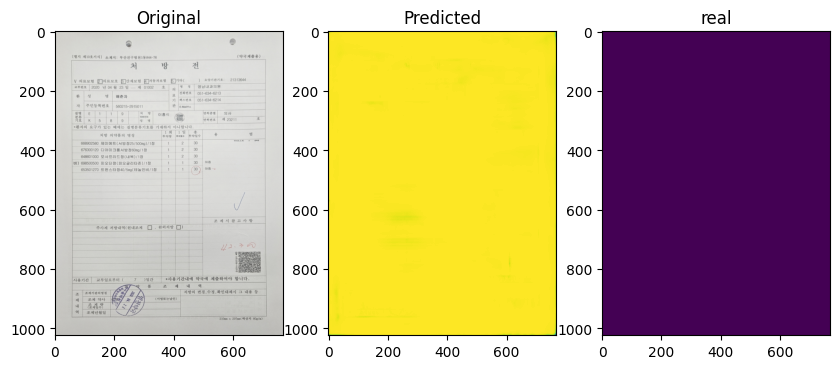

test_loss: 0.00405 -- Best loss: 0.00376 --- 3.84 seconds
cur_lr: 1.0000000000000004e-08


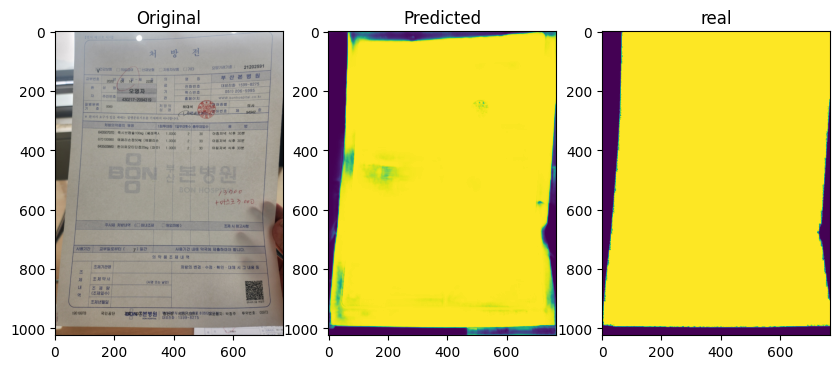

[1302 / 2000] train_loss: 0.00203   test_loss: 0.00406 -- Best loss: 0.00376 --- 3.96 seconds
cur_lr: 1.0000000000000004e-08
[1303 / 2000] train_loss: 0.00262   test_loss: 0.00396 -- Best loss: 0.00376 --- 3.75 seconds
cur_lr: 1.0000000000000004e-08
[1304 / 2000] train_loss: 0.00187   test_loss: 0.00399 -- Best loss: 0.00376 --- 3.64 seconds
cur_lr: 1.0000000000000004e-08
[1305 / 2000] train_loss: 0.00265   test_loss: 0.00402 -- Best loss: 0.00376 --- 3.87 seconds
cur_lr: 1.0000000000000004e-08
[1306 / 2000] train_loss: 0.00217   test_loss: 0.00405 -- Best loss: 0.00376 --- 3.84 seconds
cur_lr: 1.0000000000000004e-08
[1307 / 2000] train_loss: 0.00241   test_loss: 0.00408 -- Best loss: 0.00376 --- 3.44 seconds
cur_lr: 1.0000000000000004e-08
[1308 / 2000] train_loss: 0.00201   test_loss: 0.00405 -- Best loss: 0.00376 --- 3.80 seconds
cur_lr: 1.0000000000000004e-08
[1309 / 2000] train_loss: 0.00213   test_loss: 0.00408 -- Best loss: 0.00376 --- 3.73 seconds
cur_lr: 1.0000000000000004e-08


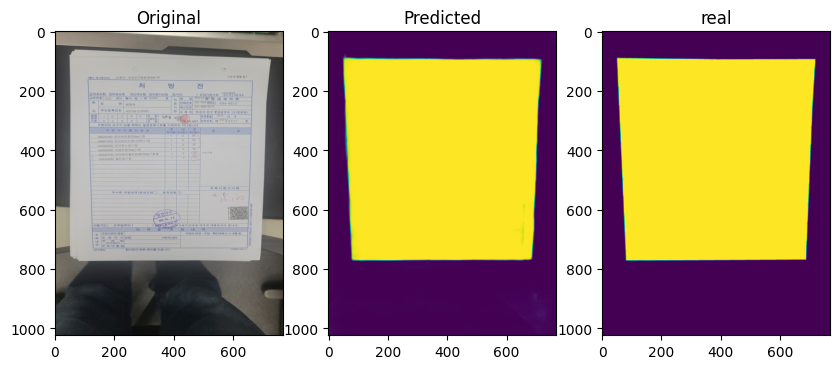

test_loss: 0.00399 -- Best loss: 0.00376 --- 3.61 seconds
cur_lr: 1.0000000000000004e-08


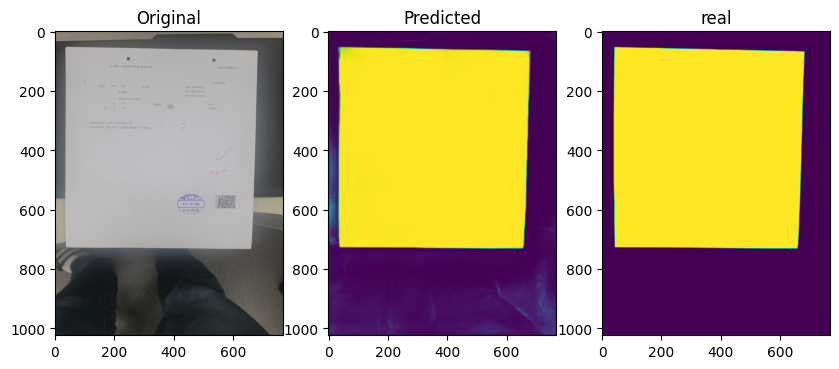

[1352 / 2000] train_loss: 0.00199   test_loss: 0.00390 -- Best loss: 0.00376 --- 3.94 seconds
cur_lr: 1.0000000000000004e-08
[1353 / 2000] train_loss: 0.00206   test_loss: 0.00389 -- Best loss: 0.00376 --- 3.84 seconds
cur_lr: 1.0000000000000004e-08
[1354 / 2000] train_loss: 0.00244   test_loss: 0.00388 -- Best loss: 0.00376 --- 3.81 seconds
cur_lr: 1.0000000000000004e-08
[1355 / 2000] train_loss: 0.00176   test_loss: 0.00396 -- Best loss: 0.00376 --- 3.72 seconds
cur_lr: 1.0000000000000004e-08
[1356 / 2000] train_loss: 0.00200   test_loss: 0.00391 -- Best loss: 0.00376 --- 4.47 seconds
cur_lr: 1.0000000000000004e-08
[1357 / 2000] train_loss: 0.00200   test_loss: 0.00399 -- Best loss: 0.00376 --- 6.13 seconds
cur_lr: 1.0000000000000004e-08
[1358 / 2000] train_loss: 0.00225   test_loss: 0.00389 -- Best loss: 0.00376 --- 5.62 seconds
cur_lr: 1.0000000000000004e-08
[1359 / 2000] train_loss: 0.00197   test_loss: 0.00392 -- Best loss: 0.00376 --- 4.89 seconds
cur_lr: 1.0000000000000004e-08


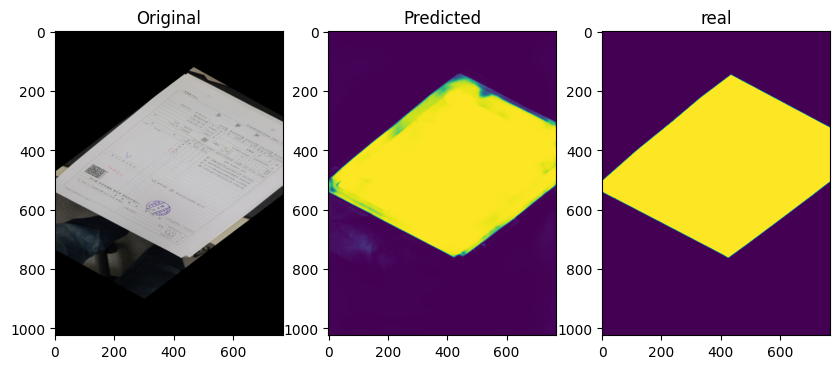

test_loss: 0.00400 -- Best loss: 0.00376 --- 3.80 seconds
cur_lr: 1.0000000000000004e-08


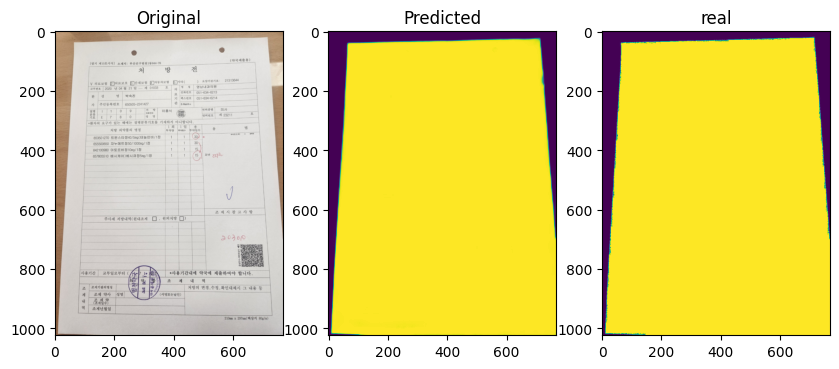

[1402 / 2000] train_loss: 0.00230   test_loss: 0.00404 -- Best loss: 0.00376 --- 4.05 seconds
cur_lr: 1.0000000000000004e-08
[1403 / 2000] train_loss: 0.00201   test_loss: 0.00403 -- Best loss: 0.00376 --- 3.84 seconds
cur_lr: 1.0000000000000004e-08
[1404 / 2000] train_loss: 0.00201   test_loss: 0.00400 -- Best loss: 0.00376 --- 3.53 seconds
cur_lr: 1.0000000000000004e-08
[1405 / 2000] train_loss: 0.00279   test_loss: 0.00407 -- Best loss: 0.00376 --- 4.71 seconds
cur_lr: 1.0000000000000004e-08
[1406 / 2000] train_loss: 0.00191   test_loss: 0.00407 -- Best loss: 0.00376 --- 3.84 seconds
cur_lr: 1.0000000000000004e-08
[1407 / 2000] train_loss: 0.00325   test_loss: 0.00399 -- Best loss: 0.00376 --- 3.91 seconds
cur_lr: 1.0000000000000004e-08
[1408 / 2000] train_loss: 0.00198   test_loss: 0.00411 -- Best loss: 0.00376 --- 3.96 seconds
cur_lr: 1.0000000000000004e-08
[1409 / 2000] train_loss: 0.00249   test_loss: 0.00411 -- Best loss: 0.00376 --- 3.96 seconds
cur_lr: 1.0000000000000004e-08


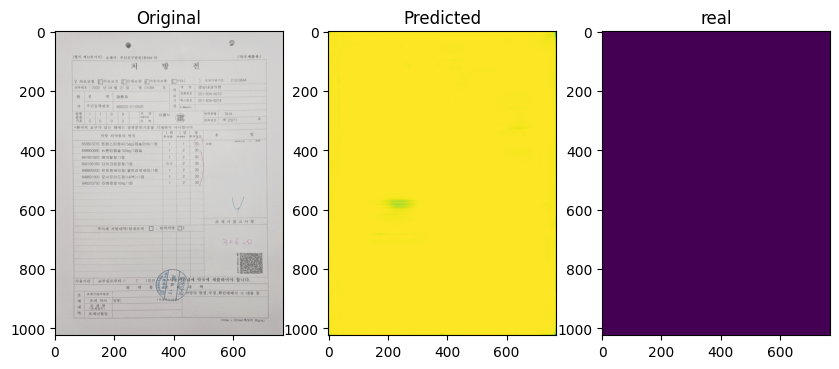

test_loss: 0.00403 -- Best loss: 0.00376 --- 3.53 seconds
cur_lr: 1.0000000000000004e-08


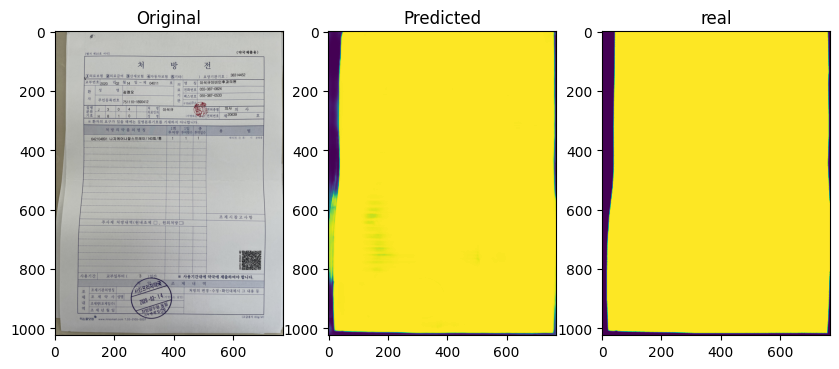

[1452 / 2000] train_loss: 0.00210   test_loss: 0.00400 -- Best loss: 0.00376 --- 3.62 seconds
cur_lr: 1.0000000000000004e-08
[1453 / 2000] train_loss: 0.00253   test_loss: 0.00395 -- Best loss: 0.00376 --- 3.68 seconds
cur_lr: 1.0000000000000004e-08
[1454 / 2000] train_loss: 0.00281   test_loss: 0.00399 -- Best loss: 0.00376 --- 3.47 seconds
cur_lr: 1.0000000000000004e-08
[1455 / 2000] train_loss: 0.00217   test_loss: 0.00399 -- Best loss: 0.00376 --- 4.15 seconds
cur_lr: 1.0000000000000004e-08
[1456 / 2000] train_loss: 0.00207   test_loss: 0.00399 -- Best loss: 0.00376 --- 3.50 seconds
cur_lr: 1.0000000000000004e-08
[1457 / 2000] train_loss: 0.00244   test_loss: 0.00396 -- Best loss: 0.00376 --- 3.33 seconds
cur_lr: 1.0000000000000004e-08
[1458 / 2000] train_loss: 0.00239   test_loss: 0.00389 -- Best loss: 0.00376 --- 3.43 seconds
cur_lr: 1.0000000000000004e-08
[1459 / 2000] train_loss: 0.00255   test_loss: 0.00389 -- Best loss: 0.00376 --- 3.41 seconds
cur_lr: 1.0000000000000004e-08


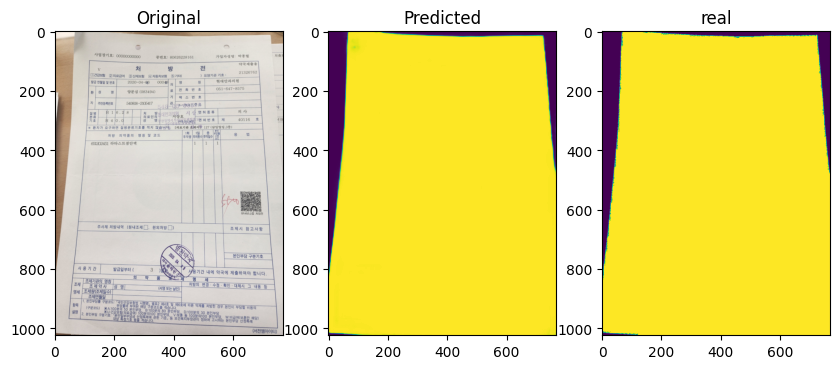

test_loss: 0.00413 -- Best loss: 0.00376 --- 3.61 seconds
cur_lr: 1.0000000000000004e-08


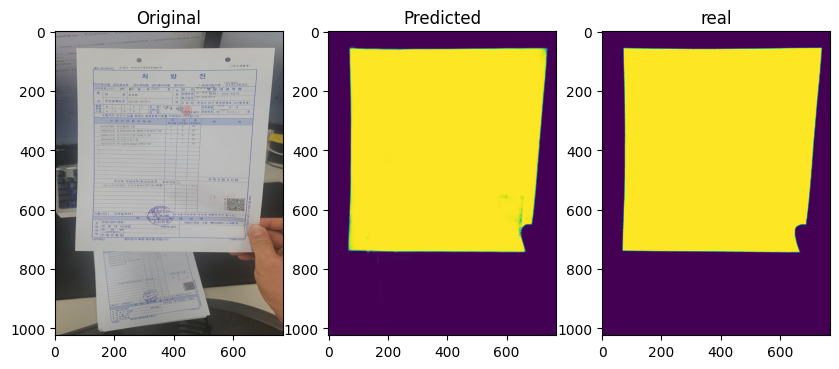

[1502 / 2000] train_loss: 0.00196   test_loss: 0.00406 -- Best loss: 0.00376 --- 3.61 seconds
cur_lr: 1.0000000000000004e-08
[1503 / 2000] train_loss: 0.00195   test_loss: 0.00409 -- Best loss: 0.00376 --- 3.49 seconds
cur_lr: 1.0000000000000004e-08
[1504 / 2000] train_loss: 0.00230   test_loss: 0.00403 -- Best loss: 0.00376 --- 3.59 seconds
cur_lr: 1.0000000000000004e-08
[1505 / 2000] train_loss: 0.00187   test_loss: 0.00403 -- Best loss: 0.00376 --- 3.85 seconds
cur_lr: 1.0000000000000004e-08
[1506 / 2000] train_loss: 0.00240   test_loss: 0.00403 -- Best loss: 0.00376 --- 3.97 seconds
cur_lr: 1.0000000000000004e-08
[1507 / 2000] train_loss: 0.00202   test_loss: 0.00401 -- Best loss: 0.00376 --- 4.15 seconds
cur_lr: 1.0000000000000004e-08
[1508 / 2000] train_loss: 0.00222   test_loss: 0.00403 -- Best loss: 0.00376 --- 4.14 seconds
cur_lr: 1.0000000000000004e-08
[1509 / 2000] train_loss: 0.00209   test_loss: 0.00404 -- Best loss: 0.00376 --- 4.23 seconds
cur_lr: 1.0000000000000004e-08


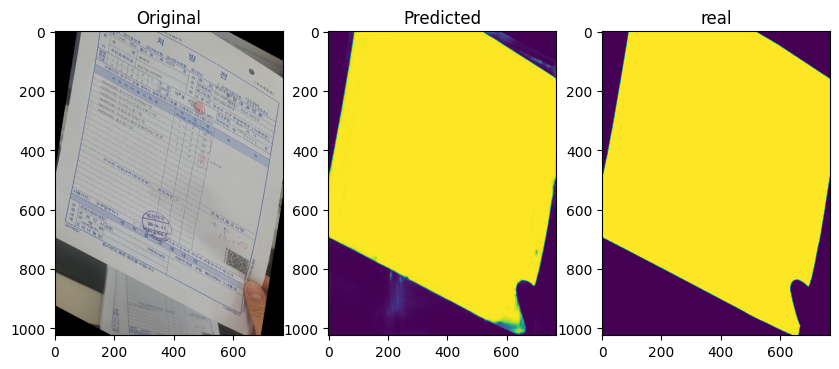

test_loss: 0.00409 -- Best loss: 0.00376 --- 3.86 seconds
cur_lr: 1.0000000000000004e-08


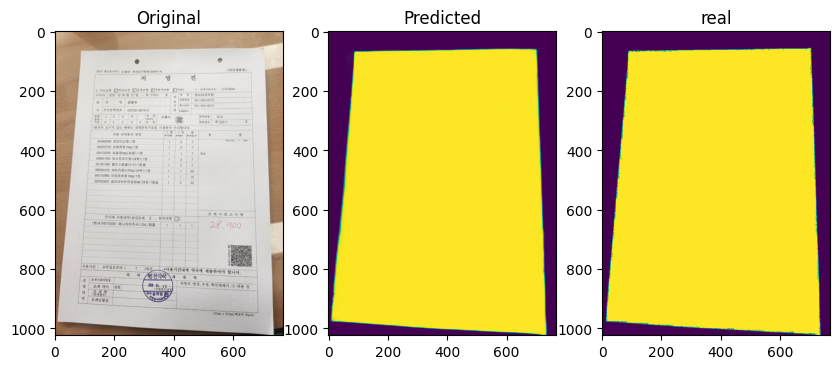

[1552 / 2000] train_loss: 0.00257   test_loss: 0.00402 -- Best loss: 0.00376 --- 3.75 seconds
cur_lr: 1.0000000000000004e-08
[1553 / 2000] train_loss: 0.00194   test_loss: 0.00394 -- Best loss: 0.00376 --- 3.96 seconds
cur_lr: 1.0000000000000004e-08
[1554 / 2000] train_loss: 0.00215   test_loss: 0.00394 -- Best loss: 0.00376 --- 3.44 seconds
cur_lr: 1.0000000000000004e-08
[1555 / 2000] train_loss: 0.00218   test_loss: 0.00401 -- Best loss: 0.00376 --- 3.92 seconds
cur_lr: 1.0000000000000004e-08
[1556 / 2000] train_loss: 0.00201   test_loss: 0.00410 -- Best loss: 0.00376 --- 3.53 seconds
cur_lr: 1.0000000000000004e-08
[1557 / 2000] train_loss: 0.00443   test_loss: 0.00406 -- Best loss: 0.00376 --- 3.68 seconds
cur_lr: 1.0000000000000004e-08
[1558 / 2000] train_loss: 0.00293   test_loss: 0.00410 -- Best loss: 0.00376 --- 3.75 seconds
cur_lr: 1.0000000000000004e-08
[1559 / 2000] train_loss: 0.00227   test_loss: 0.00410 -- Best loss: 0.00376 --- 3.60 seconds
cur_lr: 1.0000000000000004e-08


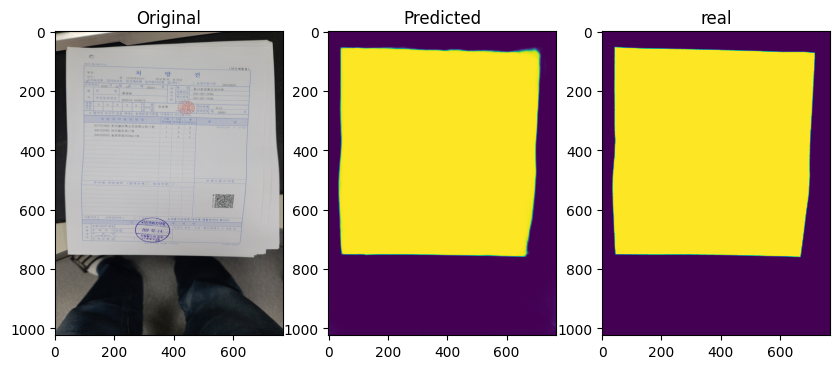

test_loss: 0.00399 -- Best loss: 0.00376 --- 3.87 seconds
cur_lr: 1.0000000000000004e-08


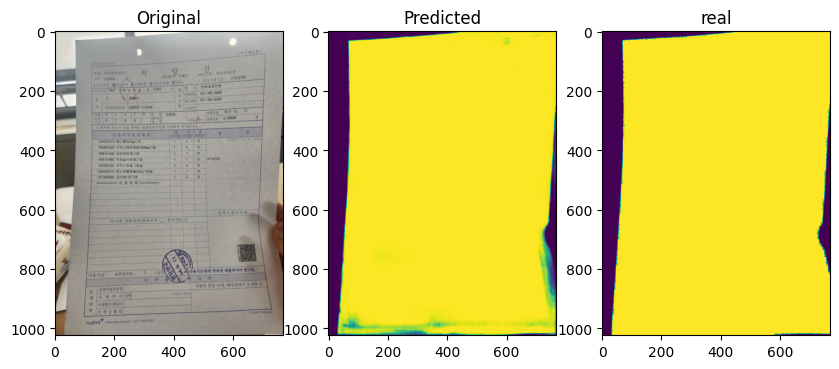

[1602 / 2000] train_loss: 0.00204   test_loss: 0.00402 -- Best loss: 0.00376 --- 3.95 seconds
cur_lr: 1.0000000000000004e-08
[1603 / 2000] train_loss: 0.00213   test_loss: 0.00392 -- Best loss: 0.00376 --- 3.70 seconds
cur_lr: 1.0000000000000004e-08
[1604 / 2000] train_loss: 0.00263   test_loss: 0.00401 -- Best loss: 0.00376 --- 3.44 seconds
cur_lr: 1.0000000000000004e-08
[1605 / 2000] train_loss: 0.00260   test_loss: 0.00400 -- Best loss: 0.00376 --- 3.86 seconds
cur_lr: 1.0000000000000004e-08
[1606 / 2000] train_loss: 0.00210   test_loss: 0.00408 -- Best loss: 0.00376 --- 3.73 seconds
cur_lr: 1.0000000000000004e-08
[1607 / 2000] train_loss: 0.00218   test_loss: 0.00407 -- Best loss: 0.00376 --- 3.50 seconds
cur_lr: 1.0000000000000004e-08
[1608 / 2000] train_loss: 0.00216   test_loss: 0.00404 -- Best loss: 0.00376 --- 3.63 seconds
cur_lr: 1.0000000000000004e-08
[1609 / 2000] train_loss: 0.00206   test_loss: 0.00408 -- Best loss: 0.00376 --- 3.79 seconds
cur_lr: 1.0000000000000004e-08


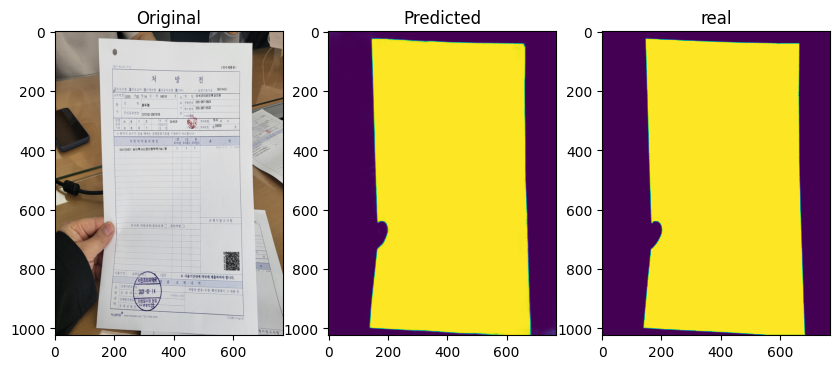

test_loss: 0.00414 -- Best loss: 0.00376 --- 3.88 seconds
cur_lr: 1.0000000000000004e-08


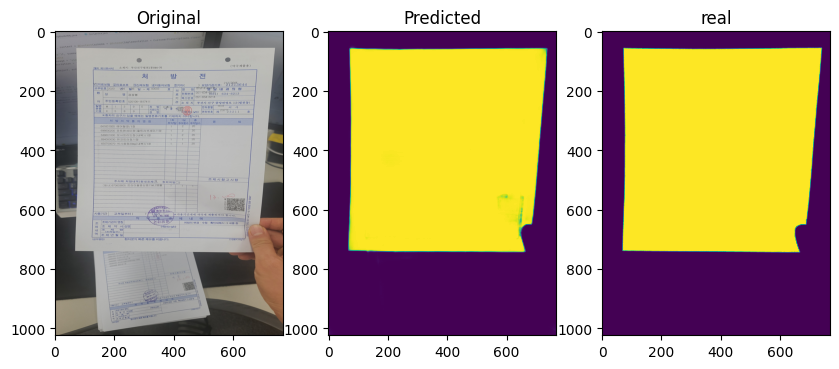

[1652 / 2000] train_loss: 0.00233   test_loss: 0.00429 -- Best loss: 0.00376 --- 3.67 seconds
cur_lr: 1.0000000000000004e-08
[1653 / 2000] train_loss: 0.00218   test_loss: 0.00415 -- Best loss: 0.00376 --- 3.72 seconds
cur_lr: 1.0000000000000004e-08
[1654 / 2000] train_loss: 0.00216   test_loss: 0.00407 -- Best loss: 0.00376 --- 3.43 seconds
cur_lr: 1.0000000000000004e-08
[1655 / 2000] train_loss: 0.00233   test_loss: 0.00405 -- Best loss: 0.00376 --- 3.87 seconds
cur_lr: 1.0000000000000004e-08
[1656 / 2000] train_loss: 0.00205   test_loss: 0.00406 -- Best loss: 0.00376 --- 3.52 seconds
cur_lr: 1.0000000000000004e-08
[1657 / 2000] train_loss: 0.00253   test_loss: 0.00395 -- Best loss: 0.00376 --- 3.52 seconds
cur_lr: 1.0000000000000004e-08
[1658 / 2000] train_loss: 0.00198   test_loss: 0.00395 -- Best loss: 0.00376 --- 3.73 seconds
cur_lr: 1.0000000000000004e-08
[1659 / 2000] train_loss: 0.00223   test_loss: 0.00398 -- Best loss: 0.00376 --- 3.65 seconds
cur_lr: 1.0000000000000004e-08


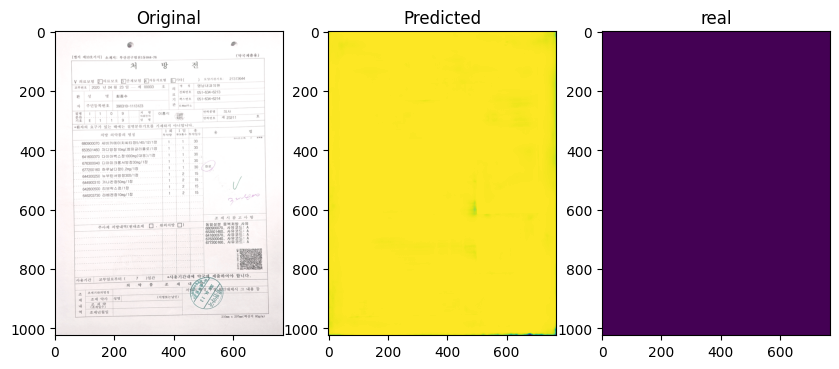

test_loss: 0.00390 -- Best loss: 0.00376 --- 3.76 seconds
cur_lr: 1.0000000000000004e-08


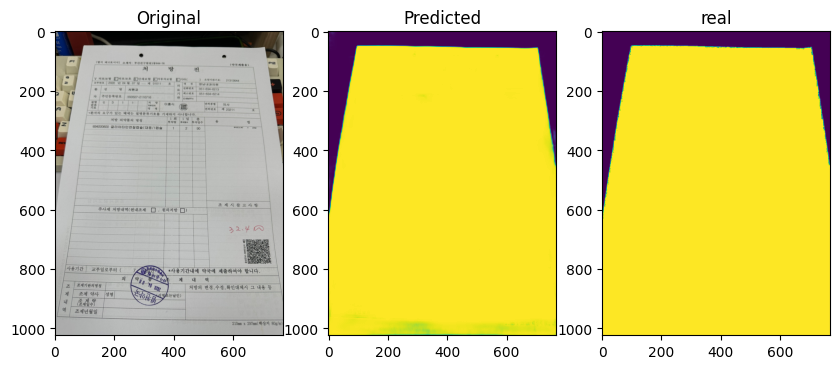

[1702 / 2000] train_loss: 0.00228   test_loss: 0.00390 -- Best loss: 0.00376 --- 3.79 seconds
cur_lr: 1.0000000000000004e-08
[1703 / 2000] train_loss: 0.00209   test_loss: 0.00398 -- Best loss: 0.00376 --- 3.98 seconds
cur_lr: 1.0000000000000004e-08
[1704 / 2000] train_loss: 0.00268   test_loss: 0.00396 -- Best loss: 0.00376 --- 3.57 seconds
cur_lr: 1.0000000000000004e-08
[1705 / 2000] train_loss: 0.00221   test_loss: 0.00404 -- Best loss: 0.00376 --- 4.48 seconds
cur_lr: 1.0000000000000004e-08
[1706 / 2000] train_loss: 0.00369   test_loss: 0.00401 -- Best loss: 0.00376 --- 4.32 seconds
cur_lr: 1.0000000000000004e-08
[1707 / 2000] train_loss: 0.00268   test_loss: 0.00407 -- Best loss: 0.00376 --- 3.76 seconds
cur_lr: 1.0000000000000004e-08
[1708 / 2000] train_loss: 0.00193   test_loss: 0.00412 -- Best loss: 0.00376 --- 3.73 seconds
cur_lr: 1.0000000000000004e-08
[1709 / 2000] train_loss: 0.00217   test_loss: 0.00399 -- Best loss: 0.00376 --- 4.02 seconds
cur_lr: 1.0000000000000004e-08


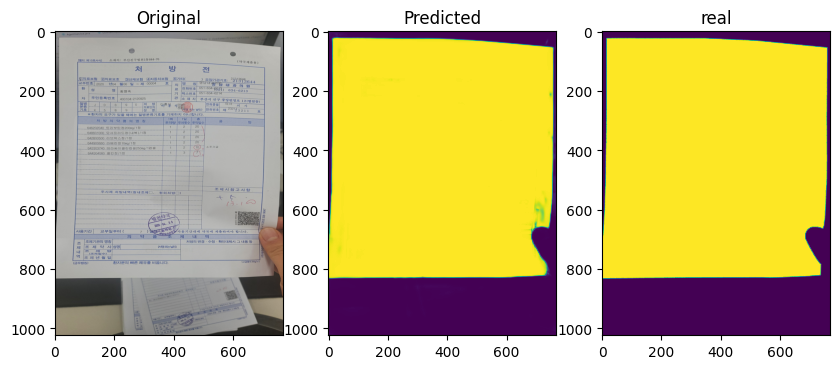

test_loss: 0.00400 -- Best loss: 0.00376 --- 3.84 seconds
cur_lr: 1.0000000000000004e-08


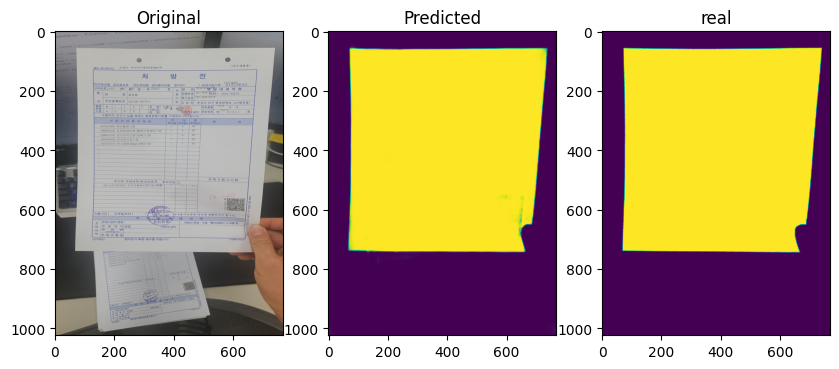

[1752 / 2000] train_loss: 0.00193   test_loss: 0.00396 -- Best loss: 0.00376 --- 3.83 seconds
cur_lr: 1.0000000000000004e-08
[1753 / 2000] train_loss: 0.00183   test_loss: 0.00400 -- Best loss: 0.00376 --- 3.57 seconds
cur_lr: 1.0000000000000004e-08
[1754 / 2000] train_loss: 0.00244   test_loss: 0.00409 -- Best loss: 0.00376 --- 3.46 seconds
cur_lr: 1.0000000000000004e-08
[1755 / 2000] train_loss: 0.00273   test_loss: 0.00406 -- Best loss: 0.00376 --- 4.28 seconds
cur_lr: 1.0000000000000004e-08
[1756 / 2000] train_loss: 0.00272   test_loss: 0.00402 -- Best loss: 0.00376 --- 4.16 seconds
cur_lr: 1.0000000000000004e-08
[1757 / 2000] train_loss: 0.00224   test_loss: 0.00407 -- Best loss: 0.00376 --- 3.55 seconds
cur_lr: 1.0000000000000004e-08
[1758 / 2000] train_loss: 0.00198   test_loss: 0.00410 -- Best loss: 0.00376 --- 3.59 seconds
cur_lr: 1.0000000000000004e-08
[1759 / 2000] train_loss: 0.00216   test_loss: 0.00412 -- Best loss: 0.00376 --- 3.78 seconds
cur_lr: 1.0000000000000004e-08


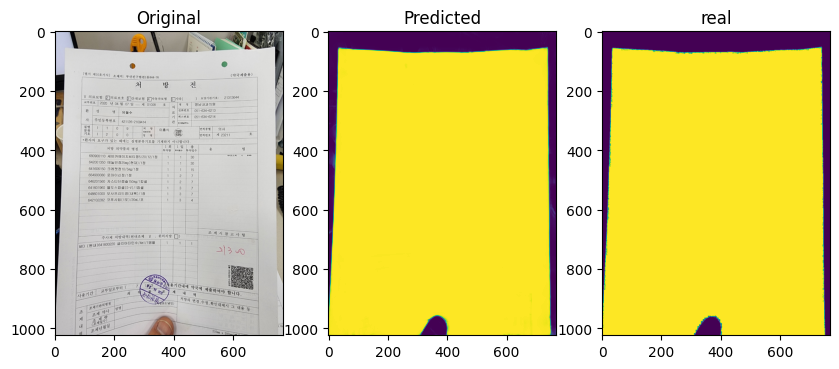

test_loss: 0.00395 -- Best loss: 0.00376 --- 3.57 seconds
cur_lr: 1.0000000000000004e-08


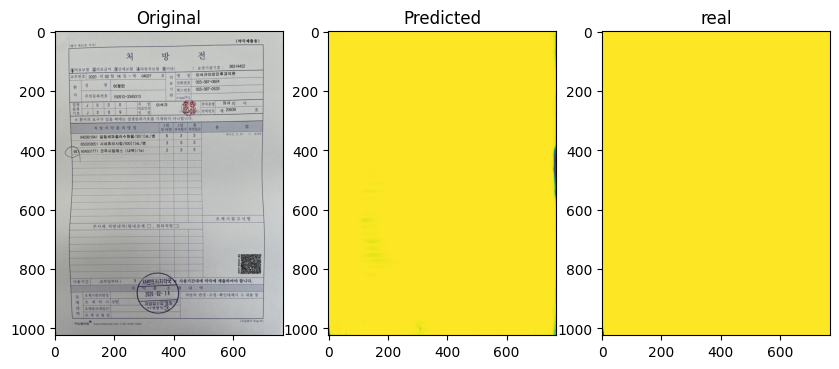

[1802 / 2000] train_loss: 0.00221   test_loss: 0.00399 -- Best loss: 0.00376 --- 3.84 seconds
cur_lr: 1.0000000000000004e-08
[1803 / 2000] train_loss: 0.00215   test_loss: 0.00407 -- Best loss: 0.00376 --- 3.92 seconds
cur_lr: 1.0000000000000004e-08
[1804 / 2000] train_loss: 0.00212   test_loss: 0.00398 -- Best loss: 0.00376 --- 3.67 seconds
cur_lr: 1.0000000000000004e-08
[1805 / 2000] train_loss: 0.00239   test_loss: 0.00403 -- Best loss: 0.00376 --- 3.74 seconds
cur_lr: 1.0000000000000004e-08
[1806 / 2000] train_loss: 0.00205   test_loss: 0.00408 -- Best loss: 0.00376 --- 3.71 seconds
cur_lr: 1.0000000000000004e-08
[1807 / 2000] train_loss: 0.00214   test_loss: 0.00412 -- Best loss: 0.00376 --- 3.76 seconds
cur_lr: 1.0000000000000004e-08
[1808 / 2000] train_loss: 0.00297   test_loss: 0.00409 -- Best loss: 0.00376 --- 4.00 seconds
cur_lr: 1.0000000000000004e-08
[1809 / 2000] train_loss: 0.00275   test_loss: 0.00403 -- Best loss: 0.00376 --- 3.96 seconds
cur_lr: 1.0000000000000004e-08


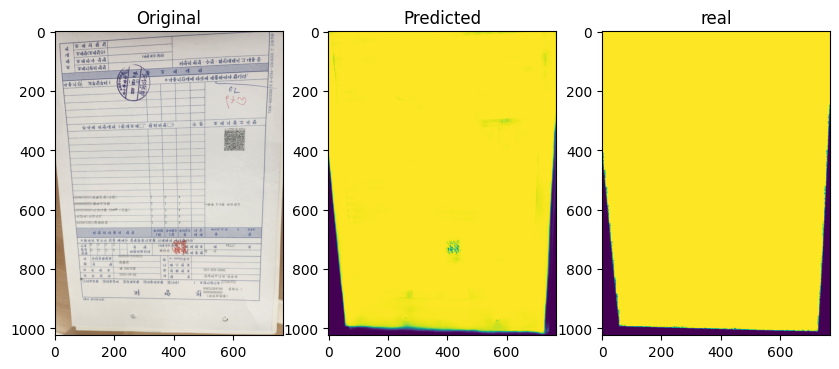

test_loss: 0.00399 -- Best loss: 0.00376 --- 3.77 seconds
cur_lr: 1.0000000000000004e-08


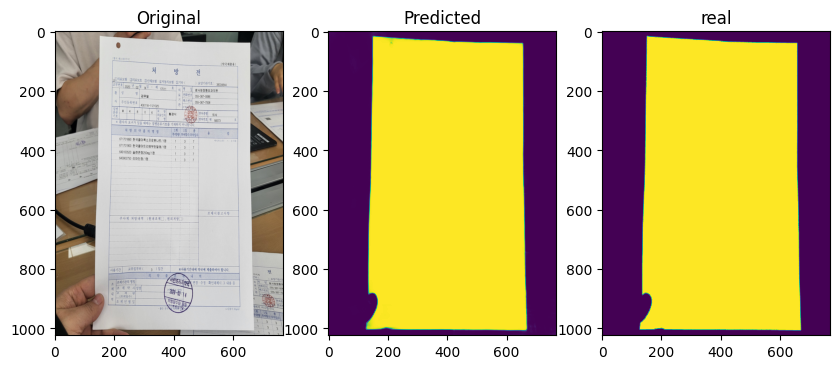

[1852 / 2000] train_loss: 0.00235   test_loss: 0.00404 -- Best loss: 0.00376 --- 3.71 seconds
cur_lr: 1.0000000000000004e-08
[1853 / 2000] train_loss: 0.00211   test_loss: 0.00395 -- Best loss: 0.00376 --- 3.55 seconds
cur_lr: 1.0000000000000004e-08
[1854 / 2000] train_loss: 0.00197   test_loss: 0.00401 -- Best loss: 0.00376 --- 3.66 seconds
cur_lr: 1.0000000000000004e-08
[1855 / 2000] train_loss: 0.00236   test_loss: 0.00396 -- Best loss: 0.00376 --- 4.08 seconds
cur_lr: 1.0000000000000004e-08
[1856 / 2000] train_loss: 0.00364   test_loss: 0.00401 -- Best loss: 0.00376 --- 3.91 seconds
cur_lr: 1.0000000000000004e-08
[1857 / 2000] train_loss: 0.00201   test_loss: 0.00394 -- Best loss: 0.00376 --- 3.67 seconds
cur_lr: 1.0000000000000004e-08
[1858 / 2000] train_loss: 0.00248   test_loss: 0.00398 -- Best loss: 0.00376 --- 3.81 seconds
cur_lr: 1.0000000000000004e-08
[1859 / 2000] train_loss: 0.00251   test_loss: 0.00394 -- Best loss: 0.00376 --- 3.52 seconds
cur_lr: 1.0000000000000004e-08


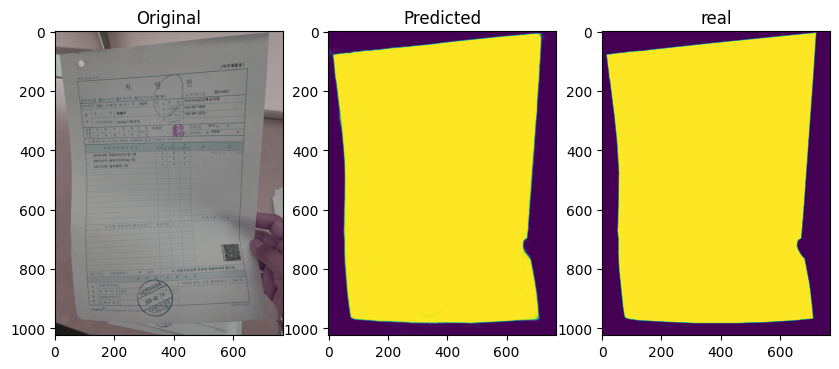

test_loss: 0.00405 -- Best loss: 0.00376 --- 3.64 seconds
cur_lr: 1.0000000000000004e-08


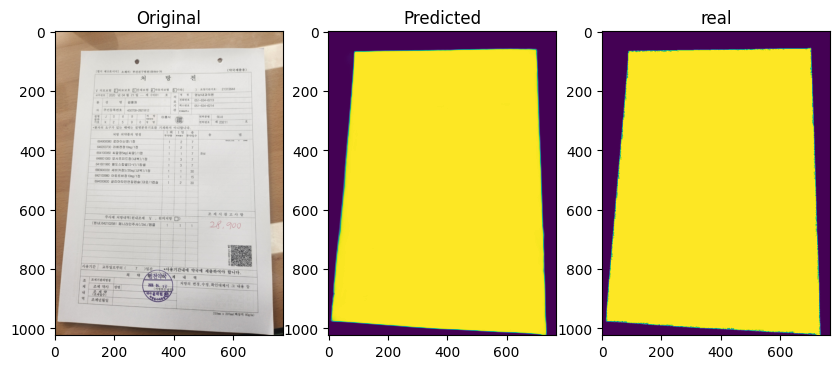

[1902 / 2000] train_loss: 0.00190   test_loss: 0.00408 -- Best loss: 0.00376 --- 3.72 seconds
cur_lr: 1.0000000000000004e-08
[1903 / 2000] train_loss: 0.00222   test_loss: 0.00414 -- Best loss: 0.00376 --- 3.57 seconds
cur_lr: 1.0000000000000004e-08
[1904 / 2000] train_loss: 0.00224   test_loss: 0.00408 -- Best loss: 0.00376 --- 3.87 seconds
cur_lr: 1.0000000000000004e-08
[1905 / 2000] train_loss: 0.00218   test_loss: 0.00417 -- Best loss: 0.00376 --- 3.72 seconds
cur_lr: 1.0000000000000004e-08
[1906 / 2000] train_loss: 0.00218   test_loss: 0.00412 -- Best loss: 0.00376 --- 3.93 seconds
cur_lr: 1.0000000000000004e-08
[1907 / 2000] train_loss: 0.00226   test_loss: 0.00403 -- Best loss: 0.00376 --- 3.69 seconds
cur_lr: 1.0000000000000004e-08
[1908 / 2000] train_loss: 0.00195   test_loss: 0.00401 -- Best loss: 0.00376 --- 4.03 seconds
cur_lr: 1.0000000000000004e-08
[1909 / 2000] train_loss: 0.00249   test_loss: 0.00402 -- Best loss: 0.00376 --- 3.77 seconds
cur_lr: 1.0000000000000004e-08


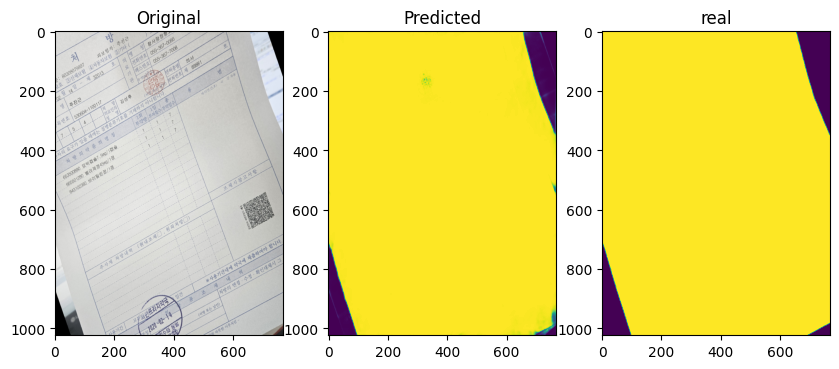

test_loss: 0.00408 -- Best loss: 0.00376 --- 3.77 seconds
cur_lr: 1.0000000000000004e-08


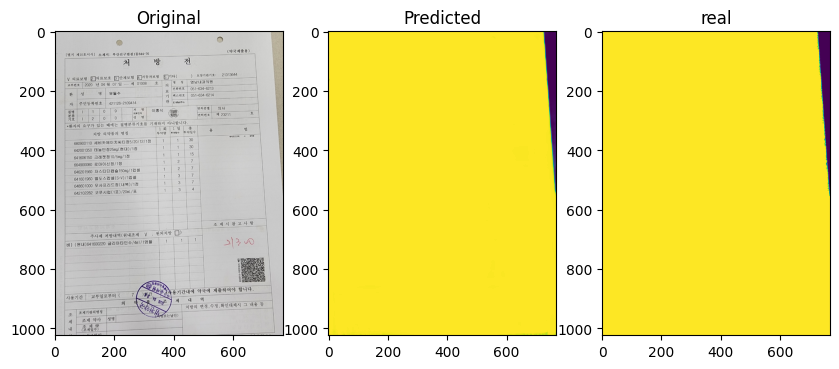

[1952 / 2000] train_loss: 0.00239   test_loss: 0.00403 -- Best loss: 0.00376 --- 3.75 seconds
cur_lr: 1.0000000000000004e-08
[1953 / 2000] train_loss: 0.00213   test_loss: 0.00405 -- Best loss: 0.00376 --- 3.44 seconds
cur_lr: 1.0000000000000004e-08
[1954 / 2000] train_loss: 0.00264   test_loss: 0.00412 -- Best loss: 0.00376 --- 3.72 seconds
cur_lr: 1.0000000000000004e-08
[1955 / 2000] train_loss: 0.00220   test_loss: 0.00415 -- Best loss: 0.00376 --- 4.16 seconds
cur_lr: 1.0000000000000004e-08
[1956 / 2000] train_loss: 0.00204   test_loss: 0.00415 -- Best loss: 0.00376 --- 3.55 seconds
cur_lr: 1.0000000000000004e-08
[1957 / 2000] train_loss: 0.00263   test_loss: 0.00408 -- Best loss: 0.00376 --- 3.78 seconds
cur_lr: 1.0000000000000004e-08
[1958 / 2000] train_loss: 0.00260   test_loss: 0.00404 -- Best loss: 0.00376 --- 3.74 seconds
cur_lr: 1.0000000000000004e-08
[1959 / 2000] train_loss: 0.00197   test_loss: 0.00407 -- Best loss: 0.00376 --- 3.86 seconds
cur_lr: 1.0000000000000004e-08


In [36]:
for epoch in range(num_epochs):
    # Train
    generator.train()

    train_loss = 0
    train_correct = 0

    start_time = time.time()
    for x, y in trainloader:
        x = x.to(device, non_blocking=True)
        y = y.to(device, non_blocking=True)

        fake = generator(x)
        optimizer_g.zero_grad()
        

        loss_g = criterion_g(fake, y)
        
        loss_total = loss_g
        loss_total.backward()
        optimizer_g.step()

        train_loss += loss_total.item()

    train_loss = train_loss / train_batches

    scheduler.step(1.)

    end_time = time.time()
    
    print('[%2d / %d] train_loss: %.5f  ' % (epoch+1, num_epochs , train_loss), end = ' ')
    
    y_hat = fake

    x = torch.permute(x.detach().cpu(), (0, 2,3, 1)).numpy()
    y_hat = torch.permute(y_hat.detach().cpu(), (0, 2,3, 1)).numpy()
    y = torch.permute(y.detach().cpu(), (0, 2,3, 1)).numpy()
    
    if epoch % 50 == 0:
        f, axarr = plt.subplots(1,3, figsize=(10,7))
        i = 0
        cur_orig = x[i]
        cur_pred = y_hat[i]
        cur_crop = y[i]

        axarr[0].imshow(cur_orig)
        axarr[0].title.set_text('Original')

        axarr[1].imshow(cur_pred)
        axarr[1].title.set_text('Predicted')

        axarr[2].imshow(cur_crop)
        axarr[2].title.set_text('real')
        plt.show()
        
    generator.eval()
    
    
    ### test acc ###
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data in testloader:
            x, y = data[0].to(device, non_blocking=True), data[1].to(device, non_blocking=True)
            outputs = generator(x)
            
            loss = criterion_g(outputs, y)
            test_loss += loss.item()
            
            
        test_loss = test_loss / test_baches
        
        if(test_loss < best_loss):
            torch.save(generator.module.state_dict(), path_checkpoint)
            best_loss = test_loss
        print('test_loss: %.5f -- Best loss: %.5f --- %.2f seconds' %(test_loss, best_loss, (end_time-start_time)))    
        print(f"cur_lr: {scheduler.optimizer.param_groups[0]['lr']}")
        
    y_hat = outputs
    x = torch.permute(x.detach().cpu(), (0, 2,3, 1)).numpy()
    y_hat = torch.permute(y_hat.detach().cpu(), (0, 2,3, 1)).numpy()
    y = torch.permute(y.detach().cpu(), (0, 2,3, 1)).numpy()


    if epoch % 50 == 0:
        f, axarr = plt.subplots(1,3, figsize=(10,7))
        i = 0
        cur_orig = x[i]
        cur_pred = y_hat[i]
        cur_crop = y[i]

        axarr[0].imshow(cur_orig)
        axarr[0].title.set_text('Original')

        axarr[1].imshow(cur_pred)
        axarr[1].title.set_text('Predicted')

        axarr[2].imshow(cur_crop)
        axarr[2].title.set_text('real')
        plt.show()

In [37]:
torch.save(generator.module.state_dict(), path_checkpoint)

In [ ]:
## Try doing CV2 algin first, then run the models?